**Toronto Bike Share Analysis**

**Import Libraries**

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import plotly.express as px
import matplotlib.dates as mdates
import seaborn as sns
from datetime import datetime
from IPython.display import display
import requests
import json
import folium
from folium import IFrame
import geopandas as gpd
import re
from folium.plugins import MarkerCluster

**Loading the Data**

In [3]:
def convert_file_encoding(source_file_path, target_file_path, source_encoding='cp1252'):
    """
    Convert the encoding of a file from source_encoding to UTF-8.

    :param source_file_path: Path to the source file with the original encoding.
    :param target_file_path: Path where the converted file should be saved.
    :param source_encoding: The encoding of the source file.
    """
    # Read the source file with the specified source encoding
    with open(source_file_path, 'r', encoding=source_encoding) as source_file:
        content = source_file.read()

    # Write the content to a new file with UTF-8 encoding
    with open(target_file_path, 'w', encoding='utf-8') as target_file:
        target_file.write(content)

# Relative base path for data files
base_path = '/Trip data'

convert_file_encoding(f'{base_path}/2023/Bike share ridership 2023-04.csv', f'{base_path}/2023/Bike share ridership 2023-04.csv', 'cp1252')
convert_file_encoding(f'{base_path}/2023/Bike share ridership 2023-05.csv', f'{base_path}/2023/Bike share ridership 2023-05.csv', 'cp1252')
convert_file_encoding(f'{base_path}/2023/Bike share ridership 2023-06.csv', f'{base_path}/2023/Bike share ridership 2023-06.csv', 'cp1252')
convert_file_encoding(f'{base_path}/2023/Bike share ridership 2023-07.csv', f'{base_path}/2023/Bike share ridership 2023-07.csv', 'cp1252')
convert_file_encoding(f'{base_path}/2023/Bike share ridership 2023-09.csv', f'{base_path}/2023/Bike share ridership 2023-09.csv', 'cp1252')
convert_file_encoding(f'{base_path}/2023/Bike share ridership 2023-10.csv', f'{base_path}/2023/Bike share ridership 2023-10.csv', 'cp1252')
convert_file_encoding(f'{base_path}/2023/Bike share ridership 2023-11.csv', f'{base_path}/2023/Bike share ridership 2023-11.csv', 'cp1252')
convert_file_encoding(f'{base_path}/2021/Bike share ridership 2021-01.csv', f'{base_path}/2021/Bike share ridership 2021-01.csv', 'cp1252')
convert_file_encoding(f'{base_path}/2021/Bike share ridership 2021-05.csv', f'{base_path}/2021/Bike share ridership 2021-05.csv', 'cp1252')
convert_file_encoding(f'{base_path}/2023/Bike share ridership 2023-08.csv', f'{base_path}/2023/Bike share ridership 2023-08.csv', 'cp1252')

In [4]:
def load_data_with_year_column(base_path):
    """
    Load data from subfolders within the base_path
    Each row in the resulting DataFrame will include the year of the data.

    :param base_path: The base directory containing year-named subfolders with data files.
    :return: A DataFrame with all data combined and a 'Year' column indicating the year for each row.
    """
    all_data = []  # List to hold dataframes with year column added

    # Iterate through each folder in the base directory
    for folder_name in os.listdir(base_path):
        folder_path = os.path.join(base_path, folder_name)

        # Check if the path is indeed a directory
        if os.path.isdir(folder_path):

            # Iterate through each file in the folder
            for file_name in os.listdir(folder_path):
                file_path = os.path.join(folder_path, file_name)

                # Read the file with cp1252 encoding, assuming CSV files
                try:
                    df = pd.read_csv(file_path, encoding='utf-8-sig')
                    df['Year'] = folder_name  # Add a 'Year' column based on the folder name
                    all_data.append(df)
                except Exception as e:
                    print(f"Failed to read {file_path}: {e}")

    # Combine all dataframes into one, if any dataframes were added
    if all_data:
        combined_df = pd.concat(all_data, ignore_index=True)
        return combined_df
    else:
        return pd.DataFrame()  # Return an empty DataFrame if no files were found or readable

# Relative path
path = '/Trip data'
trip_data = load_data_with_year_column(path)

# The resulting DataFrame, `combined_data`, contains all the data with a 'Year' column indicating the year for each row.

In [5]:
trip_data.head()

,Trip Id,Trip Duration,Start Station Id,Start Time,Start Station Name,End Station Id,End Time,End Station Name,Bike Id,User Type,Year
0,20148784,840.0,7022,01/01/2023 00:00,Simcoe St / Queen St W,7703.0,01/01/2023 00:14,NaN,1770,Casual Member,2023
1,20148785,722.0,7399,01/01/2023 00:01,Lower Jarvis / Queens Quay E,7533.0,01/01/2023 00:13,Housey St / Dan Leckie Way,6400,Casual Member,2023
2,20148786,1054.0,7269,01/01/2023 00:02,Toronto Eaton Centre (Yonge St),7076.0,01/01/2023 00:20,York St / Queens Quay W,4068,Annual Member,2023
3,20148790,1329.0,7721,01/01/2023 00:04,NaN,7685.0,01/01/2023 00:26,NaN,427,Casual Member,2023
4,20148791,1291.0,7721,01/01/2023 00:04,NaN,7685.0,01/01/2023 00:26,NaN,1840,Casual Member,2023


In [6]:
trip_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19259617 entries, 0 to 19259616
Data columns (total 11 columns):
 #   Column              Dtype  
---  ------              -----  
 0   Trip Id             int64  
 1   Trip  Duration      float64
 2   Start Station Id    object 
 3   Start Time          object 
 4   Start Station Name  object 
 5   End Station Id      object 
 6   End Time            object 
 7   End Station Name    object 
 8   Bike Id             object 
 9   User Type           object 
 10  Year                object 
dtypes: float64(1), int64(1), object(9)
memory usage: 1.6+ GB


**Data Cleaning**

In [7]:
# Normalization of Column Names
# The "Trip Duration" column has two white spaces. Remove all whitespace characters and replace non-standard characters in column names
trip_data.columns = trip_data.columns.str.replace(r'\s+', ' ', regex=True).str.strip()

In [8]:
# Check for data entry issues
misplaced_data = trip_data[~trip_data['Start Station Id'].apply(lambda x: str(x).isdigit())]

# Display the found row(s)
print(misplaced_data)

              Trip Id  Trip Duration  Start Station Id  \
12694115  10000084625         7120.0  10/03/2020 13:28   
12694312  10000306555         7120.0  10/03/2020 13:38   
12694504  10000519608         7576.0  10/03/2020 13:48   
12694723  10000755851         7357.0  10/03/2020 13:58   
12695035  10001076784         7313.0  10/03/2020 14:12   
...               ...            ...               ...   
12935354  10281521317         7417.0  10/30/2020 17:01   
12937026  10283383488         7017.0  10/30/2020 19:42   
12944449  10291748450         7417.0  10/31/2020 18:00   
12945887  10293410950         7474.0  10/31/2020 21:27   
12945947  10293474102         7015.0  10/31/2020 21:43   

                                Start Time Start Station Name  \
12694115           Gerrard St E / River St               7120   
12694312           Gerrard St E / River St               7576   
12694504       Front St E / Bayview Avenue               7357   
12694723     Lake Shore Blvd E / Leslie St 

To ensure data integrity, I first checked for data entry issues by identifying rows where multiple columns, including `Start Station Id`, `Start Time`, `Start Station Name`, `End Station Id`, `End Time`, `End Station Name`, `Bike Id`, and `User Type`, had misentered data. In these 249 rows, the data appeared to be shifted to the left, resulting in values such as `Start Time` being incorrectly recorded under `Start Station Id`, and so on for subsequent columns. This misalignment indicated a significant data entry error. To maintain a clean and accurate dataset, I removed all these rows where the data was clearly misplaced.

In [9]:
# Removing rows where 'Start Station Id' contains clearly non-numeric values (like a datetime string)

# Identify rows with non-numeric 'Start Station Id'
# I use errors='coerce' to turn non-numeric values into NaN, then notna() to find rows with numeric values
numeric_station_ids = pd.to_numeric(trip_data['Start Station Id'], errors='coerce').notna()

# Filter the DataFrame to keep only rows with numeric 'Start Station Id'
trip_data = trip_data[numeric_station_ids]

# Reset index
trip_data.reset_index(drop=True, inplace=True)

In [10]:
# Identifyign missing values
# Counting null values in each column
null_counts = trip_data.isnull().sum()

# Printing the number of null values in each column
print(null_counts)

# Remove null values
trip_data = trip_data.dropna(subset=["Start Station Name", "End Station Name", "End Station Id", "Bike Id", "Trip Duration"])

Trip Id                    0
Trip Duration             16
Start Station Id           0
Start Time                 0
Start Station Name    783014
End Station Id          7947
End Time                   0
End Station Name      791926
Bike Id                  276
User Type                  0
Year                       0
dtype: int64


In [11]:
trip_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17788964 entries, 1 to 19259367
Data columns (total 11 columns):
 #   Column              Dtype  
---  ------              -----  
 0   Trip Id             int64  
 1   Trip Duration       float64
 2   Start Station Id    object 
 3   Start Time          object 
 4   Start Station Name  object 
 5   End Station Id      object 
 6   End Time            object 
 7   End Station Name    object 
 8   Bike Id             object 
 9   User Type           object 
 10  Year                object 
dtypes: float64(1), int64(1), object(9)
memory usage: 1.6+ GB


In [12]:
# Convert 'Start Time' and 'End Time' to datetime
trip_data['Start Time'] = pd.to_datetime(trip_data['Start Time'])
trip_data['End Time'] = pd.to_datetime(trip_data['End Time'])

#  Convert "object" data types to int and string
trip_data['Start Station Id'] = trip_data['Start Station Id'].astype(int)
trip_data['End Station Id'] = trip_data['End Station Id'].astype(int)
trip_data['Bike Id'] = trip_data['Bike Id'].astype(int)
trip_data['Year'] = trip_data['Year'].astype(int)
trip_data['Start Station Name'] = trip_data['Start Station Name'].astype(str)
trip_data['End Station Name'] = trip_data['End Station Name'].astype(str)
trip_data['User Type'] = trip_data['User Type'].astype(str)

In [13]:
trip_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17788964 entries, 1 to 19259367
Data columns (total 11 columns):
 #   Column              Dtype         
---  ------              -----         
 0   Trip Id             int64         
 1   Trip Duration       float64       
 2   Start Station Id    int64         
 3   Start Time          datetime64[ns]
 4   Start Station Name  object        
 5   End Station Id      int64         
 6   End Time            datetime64[ns]
 7   End Station Name    object        
 8   Bike Id             int64         
 9   User Type           object        
 10  Year                int64         
dtypes: datetime64[ns](2), float64(1), int64(5), object(3)
memory usage: 1.6+ GB


In [14]:
# Identifying outliers in the "Trip  Duration" Column
print(trip_data["Trip Duration"].describe())

count    1.778896e+07
mean     1.047083e+03
std      9.026398e+03
min      0.000000e+00
25%      4.390000e+02
50%      7.290000e+02
75%      1.164000e+03
max      1.240378e+07
Name: Trip Duration, dtype: float64


*   The average trip duration is approximately 1,047 seconds, or roughly 17.45 minutes. This average makes sense.
*   The standard deviation is about 9,026 seconds (150 minutes), which is quite high, suggesting a significant variation in trip durations. This large deviation indicates that while most trips may be short, there are trips with exceptionally long durations that can skew the average.
*   The shortest trip duration recorded is 0 seconds, which likely represents immediate check-ins and check-outs without actual usage. These trips are irrelavnt to our anaylsis and will be removed in later stages.
*   25% (1st Quartile): 25% of the trips are 439 seconds or shorter. This value gives us the upper limit of the shortest 25% of trip durations in the dataset.
*   50% (Median): The median trip duration is 729 seconds, indicating that half of the trips are shorter than 12.15 minutes and half are longer.
*   75% (3rd Quartile): 75% of the trips have durations of 1,164 seconds or shorter, defining the upper limit of the middle 75% of the data.
*   Maximum (max): The longest trip recorded is about 12,403,780 seconds, or approximately 143 days. This is highly unusual and suggests a significant outlier, possibly due to data entry errors or bikes not being returned properly.

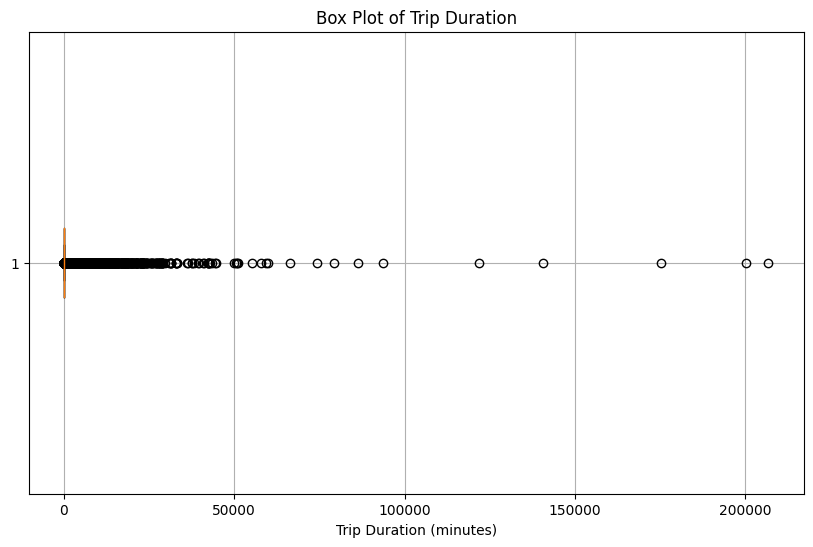

In [15]:
# Plot a box plot to visualize outliers in 'Trip Duration'
# Convert "Trip Duration" to minutes
trip_data['Trip Duration'] = trip_data['Trip Duration']/60
plt.figure(figsize=(10, 6))
plt.boxplot(trip_data['Trip Duration'], vert=False)
plt.title('Box Plot of Trip Duration')
plt.xlabel('Trip Duration (minutes)')
plt.grid(True)
plt.show()

The plot shows many outliers, which are the points outside the whiskers. These points represent trip durations that are much longer than usual. Some outliers are extremely high, going up to about 200,000 minutes (around 138 days). These very long trips are unlikely to be normal bike use and may indicate problems like bikes not returned or mistakes in the data.

In [16]:
# Function to find outliers in the 'Trip Duration' column using the IQR method.
def find_outliers_iqr(data, variable):
    Q1 = data[variable].quantile(0.25)
    Q3 = data[variable].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[variable] < lower_bound) | (data[variable] > upper_bound)]
    return outliers

outliers = find_outliers_iqr(trip_data, "Trip Duration")
print(outliers)

           Trip Id  Trip Duration  Start Station Id          Start Time  \
16        20148808      38.450000              7059 2023-01-01 00:11:00   
20        20148812      41.750000              7257 2023-01-01 00:12:00   
28        20148820      53.400000              7101 2023-01-01 00:18:00   
63        20148861      41.066667              7043 2023-01-01 00:27:00   
162       20148969      42.116667              7398 2023-01-01 00:50:00   
...            ...            ...               ...                 ...   
19258980   7333709     120.100000              7257 2019-12-31 17:43:00   
19258994   7333726      85.083333              7076 2019-12-31 17:50:00   
19259120   7333869     372.883333              7206 2019-12-31 18:54:00   
19259156   7333905      61.066667              7245 2019-12-31 19:19:00   
19259187   7333938     105.316667              7419 2019-12-31 19:45:00   

                           Start Station Name  End Station Id  \
16                 Front St W / Bl

In [17]:
# View outliers grouped by year
outliers_per_year = outliers.groupby('Year').size().reset_index(name='Number of Trips Outside IQR Bounds')
print(outliers_per_year)

   Year  Number of Trips Outside IQR Bounds
0  2019                               78255
1  2020                              138187
2  2021                              133930
3  2022                              139299
4  2023                              265894


In [18]:

# Calculate the percentage of outliers
total_rows = len(trip_data)
num_outliers = len(outliers)
percentage_outliers = (num_outliers / total_rows) * 100
print(f"Number of outliers based on IQR method: {num_outliers}")
print(f"Percentage of outliers: {percentage_outliers:.2f}%")

Number of outliers based on IQR method: 755565
Percentage of outliers: 4.25%


A total of 755,565 trips were identified as outliers, representing approximately 4.25% of the data. This proportion of outliers is reasonable and expected given the nature of the dataset, where variations in trip durations can occur due to diverse user behaviors or occasional data entry errors.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17033399 entries, 0 to 17033398
Data columns (total 11 columns):
 #   Column              Dtype         
---  ------              -----         
 0   Trip Id             int64         
 1   Trip Duration       float64       
 2   Start Station Id    int64         
 3   Start Time          datetime64[ns]
 4   Start Station Name  object        
 5   End Station Id      int64         
 6   End Time            datetime64[ns]
 7   End Station Name    object        
 8   Bike Id             int64         
 9   User Type           object        
 10  Year                int64         
dtypes: datetime64[ns](2), float64(1), int64(5), object(3)
memory usage: 1.4+ GB
None
count    1.703340e+07
mean     1.326883e+01
std      7.768003e+00
min      0.000000e+00
25%      7.133333e+00
50%      1.168333e+01
75%      1.821667e+01
max      3.751667e+01
Name: Trip Duration, dtype: float64


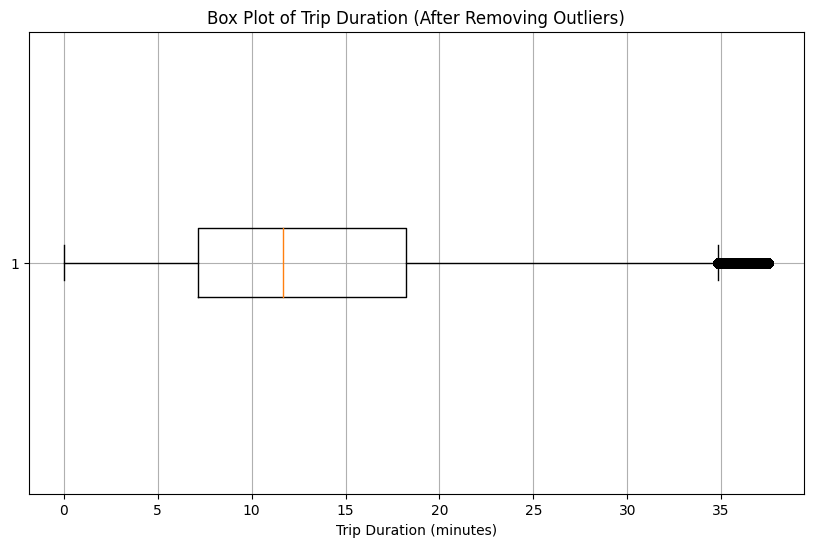

In [19]:
# Remove outliers based on the IQR method
trip_data = trip_data.drop(outliers.index)
trip_data.reset_index(drop=True, inplace=True)
print(trip_data.info())

# Check the descriptive statistics for the filtered data
print(trip_data['Trip Duration'].describe())

# Visualize the filtered data using a box plot
plt.figure(figsize=(10, 6))
plt.boxplot(trip_data['Trip Duration'], vert=False)
plt.title('Box Plot of Trip Duration (After Removing Outliers)')
plt.xlabel('Trip Duration (minutes)')
plt.grid(True)
plt.show()

The statistical analysis of the data after removing outliers is summarized below:
*   The mean trip duration decreased significantly from 17.45 minutes to 13.27 minutes, reflecting a truer average by eliminating extremely long durations.
*   There was a substantial decrease in standard deviation, from 150.43 minutes to 7.77 minutes, indicating that the data variability is much lower without the outliers. This suggests that the remaining data points are more closely clustered around the mean.
*   The interquartile range tightened considerably, showing that the middle 50% of the data is now more compact around the median, providing a clearer picture of typical user behavior.
*   The maximum value reduced drastically from about 143 days to just over 37 minutes, eliminating implausibly long trips that likely resulted from errors or special cases such as bikes not being checked back in


The min trip duration after removing outliers is 0 minutes and 25% of the trips have a duration of less than approximately 7.1 minutes. This minimum value indicates some trips started and immediately ended. I think these trips are primarily instances where people unlock bikes and then immediately lock them back up because the bike is either broken or doesn't meet their preferences. Let's remove trips with duration less than 2 mins.

In [20]:
# Count trips with duration less than 2 minutes
trips_less_than_2_mins = trip_data[trip_data['Trip Duration'] < 2].shape[0]
print(f"Number of trips with duration less than 2 minutes: {trips_less_than_2_mins}")

# Remove trips with duration less than 2 minutes
trip_data = trip_data[trip_data['Trip Duration'] >= 2]
trip_data.reset_index(drop=True, inplace=True)
print(trip_data.info())
print(trip_data['Trip Duration'].describe())

Number of trips with duration less than 2 minutes: 234997
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16798402 entries, 0 to 16798401
Data columns (total 11 columns):
 #   Column              Dtype         
---  ------              -----         
 0   Trip Id             int64         
 1   Trip Duration       float64       
 2   Start Station Id    int64         
 3   Start Time          datetime64[ns]
 4   Start Station Name  object        
 5   End Station Id      int64         
 6   End Time            datetime64[ns]
 7   End Station Name    object        
 8   Bike Id             int64         
 9   User Type           object        
 10  Year                int64         
dtypes: datetime64[ns](2), float64(1), int64(5), object(3)
memory usage: 1.4+ GB
None
count    1.679840e+07
mean     1.343656e+01
std      7.690353e+00
min      2.000000e+00
25%      7.300000e+00
50%      1.181667e+01
75%      1.833333e+01
max      3.751667e+01
Name: Trip Duration, dtype: float64


In [21]:
trip_data.head(10)

,Trip Id,Trip Duration,Start Station Id,Start Time,Start Station Name,End Station Id,End Time,End Station Name,Bike Id,User Type,Year
0,20148785,12.033333,7399,2023-01-01 00:01:00,Lower Jarvis / Queens Quay E,7533,2023-01-01 00:13:00,Housey St / Dan Leckie Way,6400,Casual Member,2023
1,20148786,17.566667,7269,2023-01-01 00:02:00,Toronto Eaton Centre (Yonge St),7076,2023-01-01 00:20:00,York St / Queens Quay W,4068,Annual Member,2023
2,20148797,4.616667,7078,2023-01-01 00:06:00,College St / Major St,7061,2023-01-01 00:11:00,Dalton Rd / Bloor St W,938,Annual Member,2023
3,20148798,4.500000,7078,2023-01-01 00:06:00,College St / Major St,7061,2023-01-01 00:11:00,Dalton Rd / Bloor St W,146,Annual Member,2023
4,20148799,7.500000,7382,2023-01-01 00:07:00,Simcoe St / Adelaide St W,7033,2023-01-01 00:14:00,Union Station,249,Casual Member,2023
5,20148804,24.250000,7569,2023-01-01 00:08:00,Toronto Inukshuk Park,7075,2023-01-01 00:33:00,Queens Quay W / Dan Leckie Way,5090,Casual Member,2023
6,20148805,23.883333,7569,2023-01-01 00:09:00,Toronto Inukshuk Park,7075,2023-01-01 00:33:00,Queens Quay W / Dan Leckie Way,298,Casual Member,2023
7,20148810,22.166667,7098,2023-01-01 00:11:00,Riverdale Park South (Broadview Ave),7164,2023-01-01 00:33:00,Gould St / Yonge St (Ryerson University),3924,Casual Member,2023
8,20148813,19.516667,7098,2023-01-01 00:14:00,Riverdale Park South (Broadview Ave),7164,2023-01-01 00:33:00,Gould St / Yonge St (Ryerson University),5789,Casual Member,2023
9,20148814,28.950000,7040,2023-01-01 00:15:00,Euclid Ave / Bloor St W,7154,2023-01-01 00:44:00,Bathurst Subway Station,7072,Casual Member,2023


Now that I have a clean dataset to work with, it is time to move on to exploratory data analysis.

**Exploratory Data Analysis: Temporal**

**Number of Annual Rides**

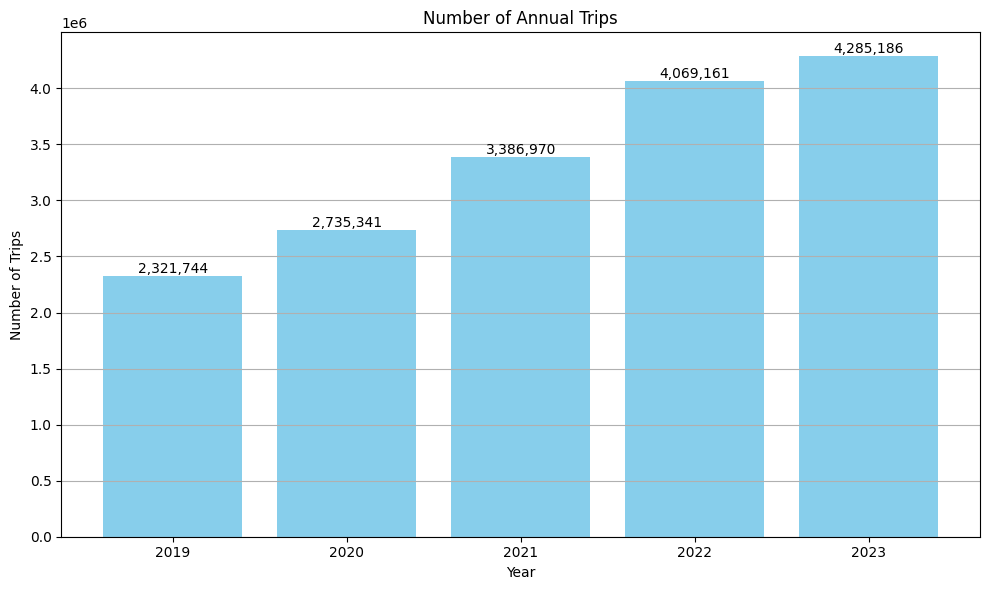

In [22]:
# Group trip_data by year
annual_trips = trip_data.groupby('Year').size()

# Plotting the number of annual trips
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(annual_trips.index, annual_trips.values, color='skyblue')
plt.title('Number of Annual Trips')
plt.xlabel('Year')
plt.ylabel('Number of Trips')
# plt.xticks(rotation=0)
plt.grid(axis='y')
# Annotate each bar with the number of unique bikes
for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, yval + 0.5, "{:,}".format(int(yval)), ha='center', va='bottom')
plt.tight_layout()
plt.show()

The data reveals a clear upward trend in the number of trips from 2019 to 2023, highlighting a growing usage of the bike-sharing service. This increase in ridership suggests that cycling is becoming a more popular mode of transportation. However, it could also be influenced by an expanded availability of bikes and stations. This raises an important question: Is the growth in ridership primarily driven by rising demand, or is it a result of increased supply? To dig into this a bit more, let's check out the number of rides for different types of memberships and how the number of bikes and stations has grown.

**Number of Annual Rides for Annual and Casual**

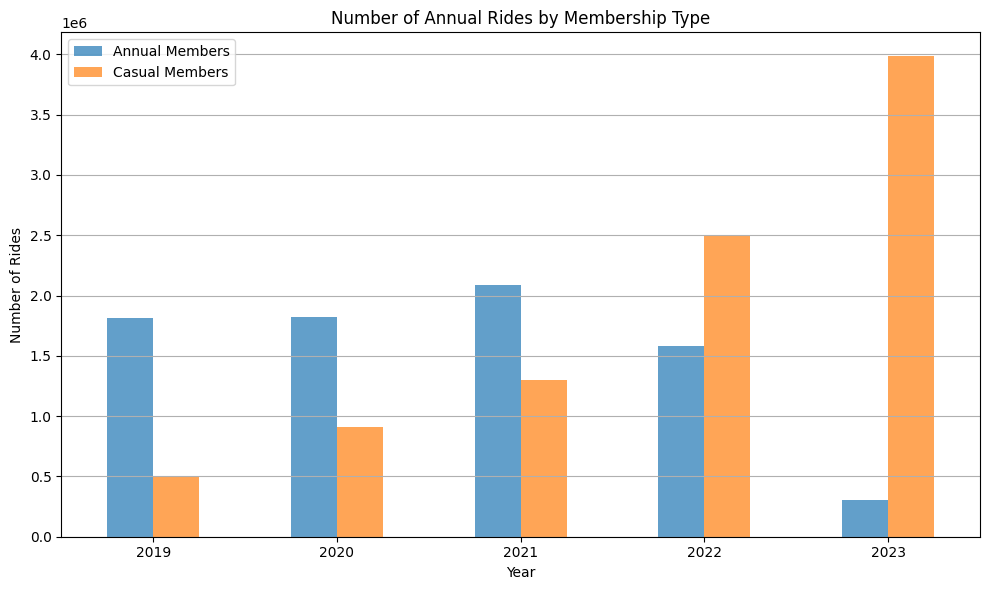

In [23]:
# Filter data for Annual and Casual Members
annual_members = trip_data[trip_data['User Type'] == 'Annual Member']
casual_members = trip_data[trip_data['User Type'] == 'Casual Member']

# Group annual member data by 'Year' and count the number of rides per year.
annual_member_rides_year = annual_members.groupby('Year').size()
casual_member_rides_year = casual_members.groupby('Year').size()

# Combine into a single DataFrame
combined_rides_year = pd.DataFrame({
    'Annual Members': annual_member_rides_year,
    'Casual Members': casual_member_rides_year
})

# Plotting the number of annual rides for each user type
combined_rides_year.plot(kind='bar', alpha=0.7, figsize=(10, 6))
plt.title('Number of Annual Rides by Membership Type')
plt.xlabel('Year')
plt.ylabel('Number of Rides')
plt.legend()
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

In [24]:
combined_rides_year

,Annual Members,Casual Members
Year,,
2019,1816724,505020
2020,1825273,910068
2021,2089043,1297927
2022,1579046,2490115
2023,302161,3983025


This graph compares the number of rides taken by annual members versus casual members from 2019 to 2023. There is an increasing trend for casual members over the years, while there is a sharp decline for annual members after 2021. This could suggest that casual rides are becoming more popular, or that changes to the system or city dynamics are influencing the type of users who choose to use the service. Here are some possible reasons behind this shift in trends:

1.   COVID-19 pandemic and the change in work model: The COVID-19 pandemic has likely contributed to this decline. With many individuals currently adopting a hybrid work model, commuting frequency has notably decreased compared to pre-pandemic levels in 2019 and early 2020. Consequently, there has been a significant downturn in the total number of rides taken by annual members.
2.   Rate changes: Another factor contributing to the decrease in rides by annual members could be the updated rate structure introduced in April 2023. Under this new policy, annual memberships no longer include free access to e-bikes, which now cost $0.10 per minute. Additionally, memberships purchased after April 2023 come with different ride limits—some are now limited to 30-minute rides, while others are capped at 45 minutes. These changes may have made the service less attractive for frequent riders, leading to a decline in rides among annual members.

      The cost for casual members also increased, but the number of rides by casual members did not decrease. The pricing for a casual single ride changed from a flat rate of $3.25 for 30 minutes to a $1 undocking fee plus $0.12 per minute for regular bikes or $0.20 per minute for e-bikes ($0.10 per minute for members). This means that a 30-minute ride now costs $4.60 for a regular bike and $7 for an e-bike. Despite these higher costs, the demand from casual riders has remained strong, indicating that casual users are still opting for the service, possibly valuing the flexibility it offers over the cost increase.

3.   Incomplete data: The data after September 2023 does not include rides by annual members, which could also account for the apparent decline in annual ridership shown in the graph. The missing data on annual rides from September to December could be due to several factors. One possibility is that changes in the rate structure introduced in April 2023 may have led to adjustments in how rides are recorded or categorized, potentially causing a gap in data collection. There could also be technical issues, delays in data processing, or changes in the reporting system at Toronto Bike Share that resulted in this missing information.




**Bike Supply over year**

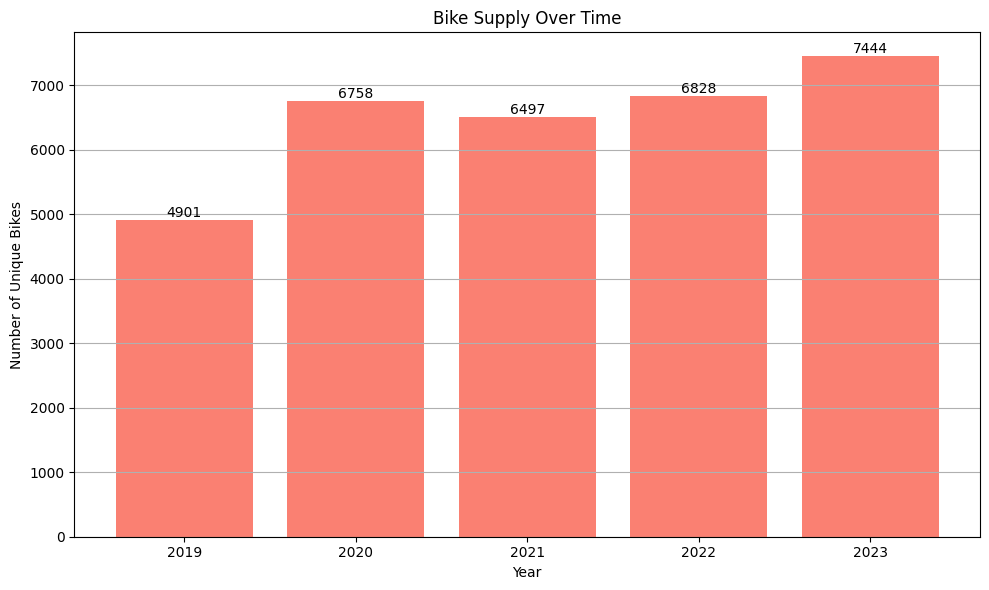

In [25]:
# Count unique bikes per year
unique_bikes_per_year = trip_data.groupby('Year')['Bike Id'].nunique()

# Print out the count of unique bikes for each year
unique_bikes_per_year

# Plotting
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(unique_bikes_per_year.index, unique_bikes_per_year.values, color='salmon')
plt.title('Bike Supply Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Unique Bikes')
plt.grid(axis='y')
# Annotate each bar with the number of unique bikes
for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, yval + 0.5, int(yval), ha='center', va='bottom')
plt.tight_layout()
plt.show()

The supply of bikes has increased almost every year, except for a slight decrease in 2021. This decrease could be a temporary response to the COVID-19 pandemic or due to cycling out older bikes for maintenance or replacement with newer models. Another possible reason could be removing less efficient or seldom-used bikes to cut costs during the pandemic. The general upward trend resumed with the highest number of bikes recorded in 2023. This growth in bike supply supports the increased trip volumes and indicates an expansion in service capacity.

**Station supply over years**

In [26]:
print("Number of Unique Start Station Id is:", trip_data["Start Station Id"].nunique())
print("Number of Unique Start Station Name is:", trip_data["Start Station Name"].nunique())
print("Number of Unique End Station Id is:", trip_data["End Station Id"].nunique())
print("Number of Unique End Station Name is:", trip_data["End Station Name"].nunique())

all_station_Ids = pd.concat([trip_data["Start Station Id"], trip_data["End Station Id"]])
unique_station_Ids = all_station_Ids.unique()
print("Number of Unique Station Id is:", all_station_Ids.nunique())

all_station_names = pd.concat([trip_data["Start Station Name"], trip_data["End Station Name"]])
unique_station_names = all_station_names.unique()
print("Number of Unique Station Name is:", all_station_names.nunique())

Number of Unique Start Station Id is: 626
Number of Unique Start Station Name is: 744
Number of Unique End Station Id is: 626
Number of Unique End Station Name is: 745
Number of Unique Station Id is: 626
Number of Unique Station Name is: 745


There are discrepancies between the counts of unique stations when categorized by name versus by ID. There are more unique station names than IDs. Let's check to see if there are multiple names associated with a single ID.

In [27]:
# Ther number of unique stations by name is more than
# Group by 'Start Station Id' and see if there are multiple names associated with single IDs
station_names_per_id = trip_data.groupby('Start Station Id')['Start Station Name'].unique()

# Filter to only show those with more than one name per ID
multiple_names_per_id = station_names_per_id[station_names_per_id.apply(len) > 1]

print(multiple_names_per_id)

Start Station Id
7001    [Wellesley Station Green P, Lower Jarvis St / ...
7039    [Simcoe St / Michael Sweet Ave, Simcoe St / Mi...
7051    [Wellesley St E / Yonge St (Green P), Mutual S...
7068    [Blantyre Park, Dockside Dr / Queens Quay E (S...
7070    [25 York St – Union Station South, 25 York St ...
                              ...                        
7648                     [909 Yonge St, Rosedale Station]
7649    [Greenwood Subway Station, Greenwood Subway St...
7654    [Bloor St W / Pacific Ave, Bloor St W / Pacifi...
7657                   [1 Market St - SMART, 1 Market St]
7658    [Kings Mill Park, Holland Park Ave / Oakwood Ave]
Name: Start Station Name, Length: 111, dtype: object


In [28]:
print(multiple_names_per_id[7658])

['Kings Mill Park' 'Holland Park Ave / Oakwood Ave']


In this analysis, I observed a noteworthy discrepancy: there are multiple station names associated with some station IDs. To understand this anomaly, I conducted a thorough review of the station names linked to each ID and cross-referenced these names against the official Bike Share Toronto system map available at: https://bikesharetoronto.com/system-map/

There are several station names that do not appear on the current map. For instance, the station "Holland Park Ave / Oakwood Ave" is listed in the dataset but is absent from the Bike Share network's current offerings. This discrepancy suggests that some station names may have been changed or removed from the system, yet the old names still persist in the dataset due to outdated entries or data entry errors.

Given the potential for such inaccuracies and the stability of station IDs over time, I decided to use station IDs as the primary identifier for stations within the Bike Share Toronto network for this project. This approach ensures greater data integrity and reliability in the analysis, as station IDs are less susceptible to the types of variances and errors observed in station names.

In [29]:
# Combine all station IDs into one list, including duplicates across years
all_station_Ids = pd.concat([trip_data["Start Station Id"], trip_data["End Station Id"]])

# To count unique station IDs across all years:
total_unique_station_ids = all_station_Ids.nunique()
print("Total Number of Unique Station IDs across all years:", total_unique_station_ids)

# For a year-by-year comparison, ensure that IDs from both start and end stations are considered together
unique_station_ids_by_year = trip_data.groupby('Year').apply(
    lambda x: pd.unique(x[['Start Station Id', 'End Station Id']].values.ravel()).size
)
print("Number of Unique Station IDs per Year:")
print(unique_station_ids_by_year)

Total Number of Unique Station IDs across all years: 626
Number of Unique Station IDs per Year:
Year
2019    468
2020    604
2021    621
2022    608
2023    591
dtype: int64


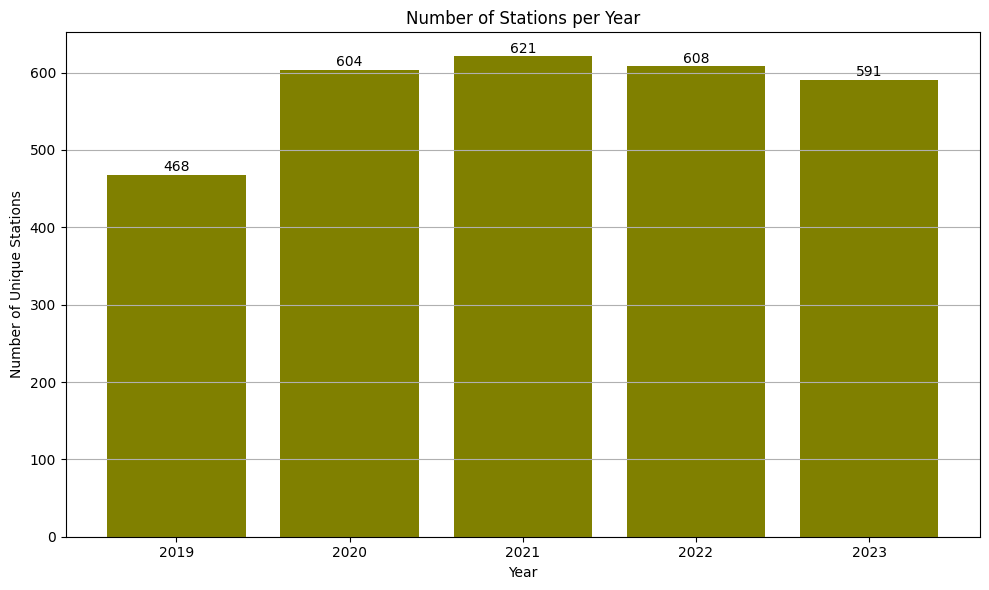

In [30]:
# plot the stations
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(unique_station_ids_by_year.index, unique_station_ids_by_year.values, color='olive')
plt.title('Number of Stations per Year')
plt.xlabel('Year')
plt.ylabel('Number of Unique Stations')
plt.grid(axis='y')
# Annotate each bar with the number of unique bikes
for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, yval + 0.5, int(yval), ha='center', va='bottom')
plt.tight_layout()
plt.show()

This graph displays the number of distinct docking stations or bike-share locations available between 2019 and 2023. Despite the overall upward trend in the number of stations from 2019 to 2023, there was a slight reduction in 2022 and 2023. The initial growth in station numbers corresponds with the increased trip volumes and bike supplies, suggesting efforts to expand the network's reach. However, the reduction in 2022 and 2023 might reflect strategic adjustments, possibly optimizing station placement or responding to shifts in usage patterns that no longer justify a continuously expanding number of stations.

**Conclusion**


*   The data from the bike-sharing program from 2019 to 2023 illustrates a robust increase in both the demand (annual trips) and supply (number of bikes and stations), highlighting a period of significant growth and expansion.
*   While the demand has seen a consistent rise, particularly with a notable increase in casual membership usage in recent years, the supply of bikes has generally kept pace, except for a deliberate reduction in the number of stations in 2022 and 2023. This reduction in station numbers, despite the growing bike fleet and usage, suggests a strategic shift towards optimizing station locations to enhance service efficiency and user experience.








**Bike Ridership per Month**

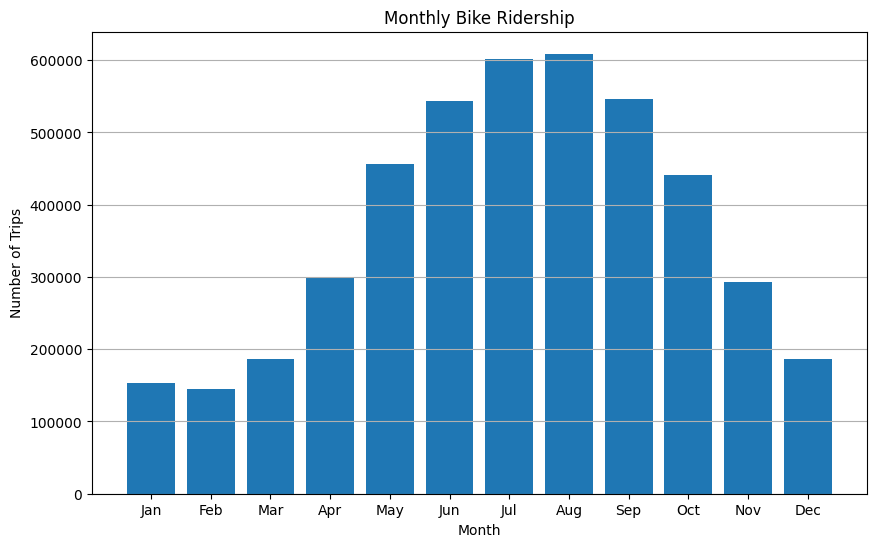

In [31]:
# Plot the overall monthly ridership
trip_data.set_index("Start Time", inplace=True)
monthly_trips = trip_data.resample('M').size().reset_index(name='Number of Trips')
plt.figure(figsize=(10, 6))
plt.bar(monthly_trips['Start Time'].dt.month, monthly_trips['Number of Trips'])
plt.title('Monthly Bike Ridership')
plt.xlabel('Month')
plt.ylabel('Number of Trips')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(axis='y')
plt.show()

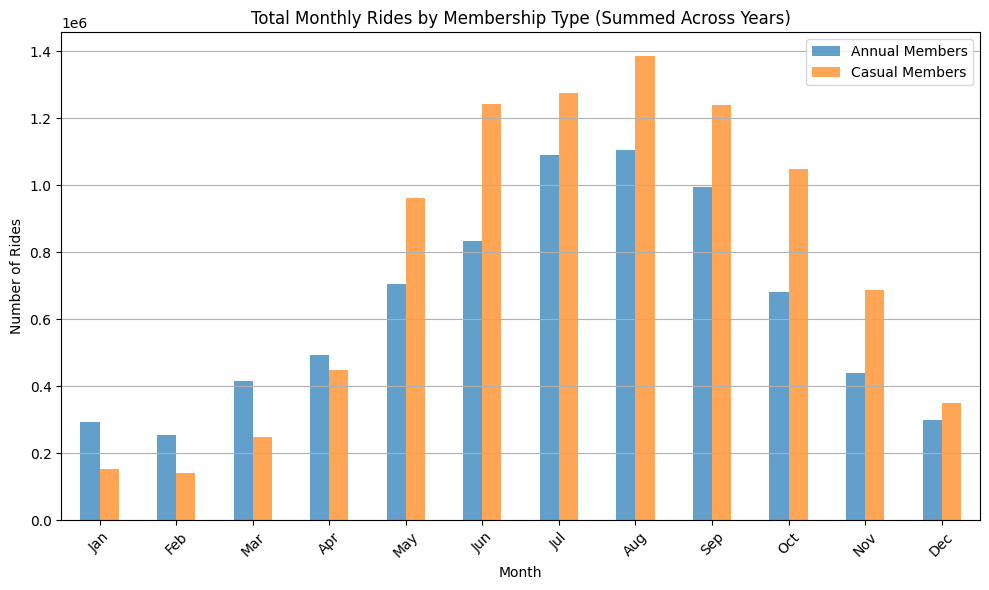

In [32]:
# Monthly rides by membership type

# Extract the month from the 'Start Time' index
# trip_data['Month'] = trip_data.index.month

# Set 'Start Time' as the index
annual_members.set_index('Start Time', inplace=True)
casual_members.set_index('Start Time', inplace=True)

# Resample by month and count the number of rides for each membership type
annual_member_rides_month = annual_members.resample('M').size()
casual_member_rides_month = casual_members.resample('M').size()

# Combine into a single DataFrame
combined_rides_month = pd.DataFrame({
    'Annual Members': annual_member_rides_month,
    'Casual Members': casual_member_rides_month
}).fillna(0)

# Group by month to sum across all years
combined_rides_by_month = combined_rides_month.groupby(combined_rides_month.index.month).sum()

# Plotting the number of monthly rides for each user type across all years
combined_rides_by_month.plot(kind='bar', alpha=0.7, figsize=(10, 6))
plt.title('Total Monthly Rides by Membership Type (Summed Across Years)')
plt.xlabel('Month')
plt.ylabel('Number of Rides')
plt.xticks(range(12), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=45)
plt.legend()
plt.grid(axis='y')
plt.tight_layout()
plt.show()

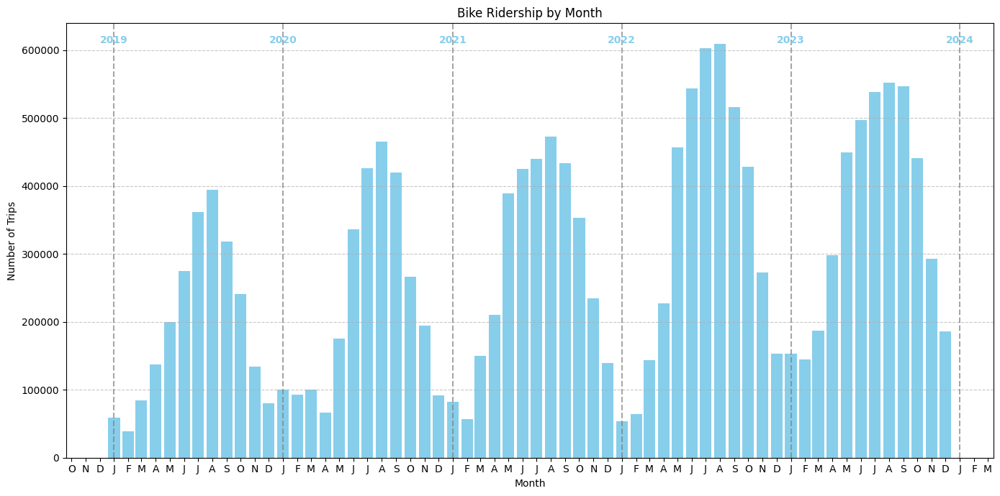

In [33]:
# plot the monthly ridership between 2019 and 2023
from matplotlib.ticker import FuncFormatter
# Set 'Start Time' to the first day of each month
monthly_trips['Start Time'] = monthly_trips['Start Time'].apply(lambda x: x.replace(day=1))
# Custom function to format months as a single letter
def format_month(x, pos=None):
    return x.strftime('%b')[0]

plt.figure(figsize=(14, 7))
plt.bar(monthly_trips['Start Time'], monthly_trips['Number of Trips'], color='skyblue', width=25, align='center')
plt.title('Bike Ridership by Month')
plt.xlabel('Month')
plt.ylabel('Number of Trips')
# Configure x-axis ticks to show months as single letters
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())  # Major ticks for every month
plt.gca().xaxis.set_major_formatter(FuncFormatter(lambda x, _: format_month(mdates.num2date(x))))  # Use custom formatter for months

# Rotate and align month labels for better readability
plt.xticks(rotation=0, ha='center')

# Add vertical lines to divide years and place year labels at each vertical line at the top
for year in pd.date_range(start='2019-01-01', end='2024-01-01', freq='YS'):
    plt.axvline(x=year, color='gray', linestyle='--', alpha=0.7)  # Vertical line for each year
    # Add year label above the plot
    plt.text(year, plt.gca().get_ylim()[1] * 0.95, year.year, ha='center', va='bottom', fontsize=10, color='skyblue', weight='bold')

# Add gridlines for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()

*   There is a clear seasonal pattern in bike ridership. Ridership increases significantly from April, peaks in July and August, and then gradually decreases through the fall and winter months.
*   The lowest ridership months are typically January and February, which is likely due to colder weather and potentially less favorable biking conditions.
*   Each year's pattern follows a similar seasonal trend, showing an increase in the number of trips during the summer months and a decrease during the winter months.


**Bike Ridership per Day of the Week**

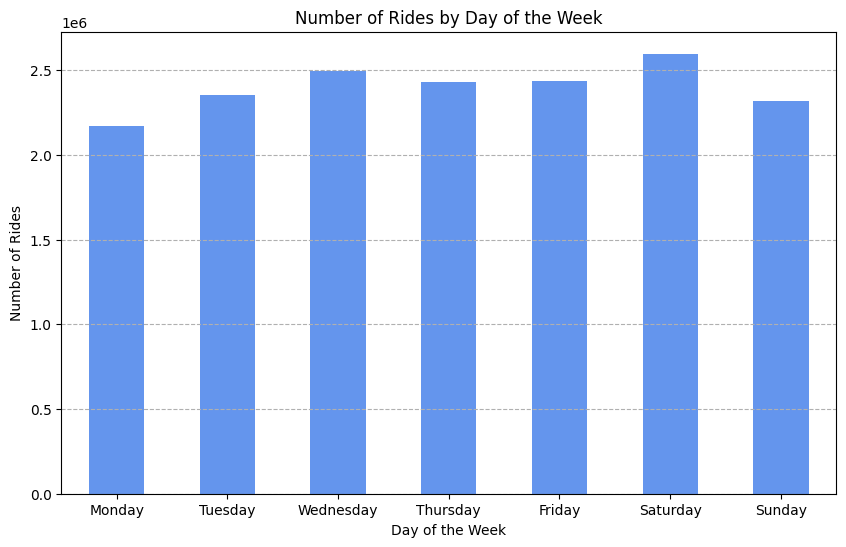

In [34]:
# Plot the overall daily
# Extract day of the week (Monday=0, Sunday=6) and add it as a new column
trip_data['Day of Week'] = trip_data.index.dayofweek

# Count the number of rides for each day of the week
rides_per_day = trip_data.groupby('Day of Week').size()

# Map the day of the week from numbers to names for readability
day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
rides_per_day.index = day_names

# Plotting
plt.figure(figsize=(10, 6))
rides_per_day.plot(kind='bar', color='cornflowerblue')

# Formatting the plot
plt.title('Number of Rides by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Rides')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--')

# Show the plot
plt.show()

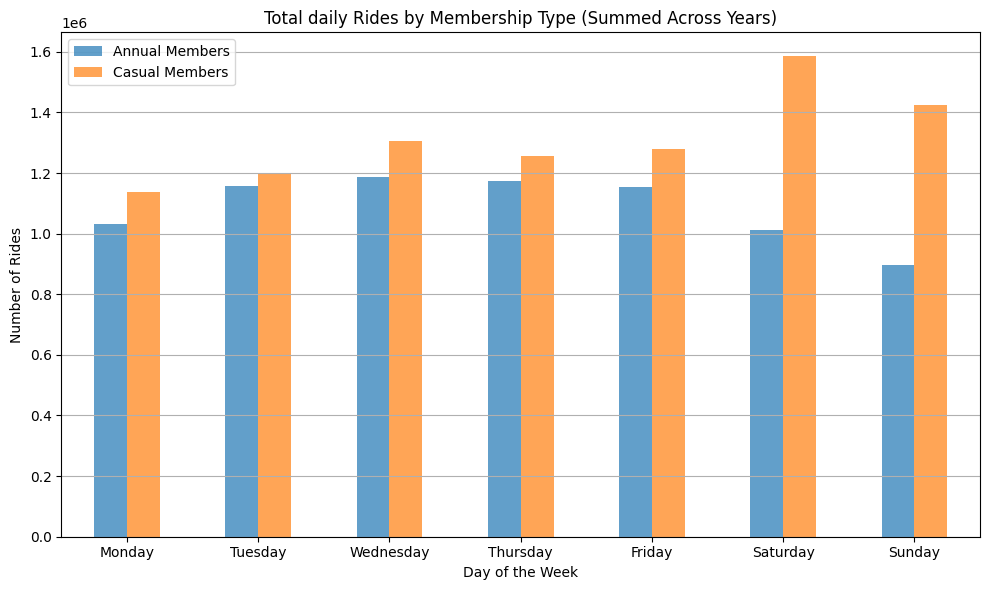

In [35]:
# Daily rides by membership type
# Resample by day to count the number of rides for each day
annual_member_rides_daily = annual_members.resample('D').size()
casual_member_rides_daily = casual_members.resample('D').size()

# Group by day of the week (0=Monday, 6=Sunday) and sum the rides
annual_rides_per_day = annual_member_rides_daily.groupby(annual_member_rides_daily.index.dayofweek).sum()
casual_rides_per_day = casual_member_rides_daily.groupby(casual_member_rides_daily.index.dayofweek).sum()

# Combine into a single DataFrame
combined_rides_daily = pd.DataFrame({
    'Annual Members': annual_rides_per_day,
    'Casual Members': casual_rides_per_day
}).fillna(0)

# Map the day of the week from numbers to names for readability
day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
combined_rides_daily.index = day_names

# Plotting the number of monthly rides for each user type across all years
combined_rides_daily.plot(kind='bar', alpha=0.7, figsize=(10, 6))
plt.title('Total daily Rides by Membership Type (Summed Across Years)')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Rides')
plt.xticks(rotation=0)
plt.legend()
plt.grid(axis='y')
plt.tight_layout()
plt.show()

The graph shows the number of rides per day of the week for both annual and casual members, summed across all years. There is a noticeable difference between the two membership types, indicating different usage patterns.



*   **Annual Members**
  *   Annual members have a relatively consistent number of rides from Monday to Friday. This suggests regular commuting patterns, likely related to work or school.
  *   There is a drop in rides on Saturdays and Sundays, reflecting fewer commutes during the weekend.
*   **Casual Members:**
  *   Casual members have a distinct increase in rides on Saturdays and Sundays. This could be due to leisure activities, tourism, or occasional biking rather than daily commutes.
  *   Rides for casual members are lower on weekdays compared to weekends, which aligns with the idea that casual memberships are more popular for recreational or occasional use.

 Given these factors, it is worth examining the daily usage trends over the years to see if there has been a change in ridership patterns before and after the COVID-19 pandemic. Analyzing this data could provide insights into shifts in commuting habits, remote work trends, and overall changes in bike-sharing demand influenced by the pandemic and changing work cultures.

In [36]:
# Group by Year and Day of Week to get the total number of rides
trip_data.reset_index(inplace=True)

# Extract year and day of the week
trip_data['Year'] = trip_data['Start Time'].dt.year
trip_data['Day of Week'] = trip_data['Start Time'].dt.day_name()

# # Check the first few rows to ensure data extraction is correct
# print(trip_data.head())

# Ensure to sum the actual trip counts if available, not the size
if 'Trip Count' in trip_data.columns:  # Replace 'Trip Count' with the correct column name for ride counts
    rides_per_day_year = trip_data.groupby(['Year', 'Day of Week'])['Trip Count'].sum().reset_index(name='Total number of rides per day of the week')
else:
    rides_per_day_year = trip_data.groupby(['Year', 'Day of Week']).size().reset_index(name='Total number of rides per day of the week')

# Ensure days of the week are in order
rides_per_day_year['Day of Week'] = pd.Categorical(
    rides_per_day_year['Day of Week'],
    categories=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
    ordered=True
)

# Pivot the DataFrame to show the total number of rides per day of the week for each year
rides_per_day_year_pivot = rides_per_day_year.pivot_table(index='Day of Week', columns='Year', values='Total number of rides per day of the week', aggfunc='sum')

# Display the resulting DataFrame
print(rides_per_day_year_pivot)

Year           2019    2020    2021    2022    2023
Day of Week                                        
Monday       334690  328688  429132  505777  572077
Tuesday      356199  349834  429612  567298  651707
Wednesday    370031  385107  488971  591525  657550
Thursday     347851  359363  466294  596916  659331
Friday       358882  394803  470492  584148  625423
Saturday     282188  496567  575367  661472  580954
Sunday       271903  420979  527102  562025  538144


<ipython-input-37-29d1d0d4b238>:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  rides_per_year_day = trip_data.groupby(['Year', 'Day of Week']).size().unstack()


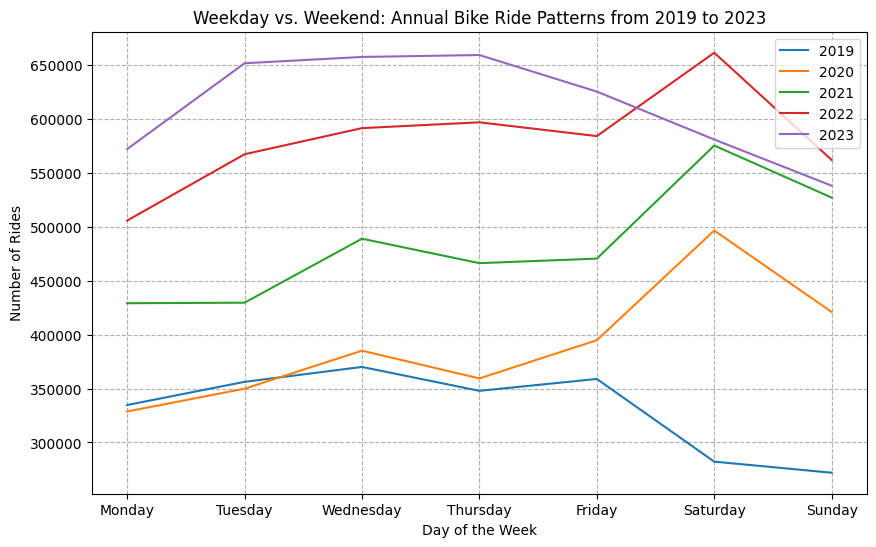

In [37]:
# Ensure days of the week are in correct order using categorical data type
trip_data['Day of Week'] = pd.Categorical(
    trip_data['Day of Week'],
    categories=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
    ordered=True
)
# Count the number of rides for each year and hour
rides_per_year_day = trip_data.groupby(['Year', 'Day of Week']).size().unstack()
# Plot the data
plt.figure(figsize=(10, 6))
for year in rides_per_year_day.index:
    plt.plot(rides_per_year_day.columns, rides_per_year_day.loc[year], label=year)

plt.title('Weekday vs. Weekend: Annual Bike Ride Patterns from 2019 to 2023')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Rides')
# plt.xticks(range(7))  # Assuming 7 days in a week
plt.legend()
plt.grid(True, linestyle='--')
plt.show()

*   **2019 Weekday Dominance:** In 2019, the ridership was significantly higher during weekdays than weekends, indicating a strong preference for bike-sharing as a commuting option.
*   **Shift in Usage Patterns Post-COVID:** The significant increase in ridership on weekends from 2020 onwards indicates a shift toward more leisure-oriented or flexible work arrangements. However, the decline in 2023 weekend ridership suggests a possible new trend or external factors affecting usage patterns.
*   **Consistent Weekday Recovery:** The ridership from Tuesday to Friday has shown strong recovery, especially in 2022 and 2023, reflecting a possible return to regular weekday usage or a shift in work patterns.

**Bike Ridership per Hour**

The busiest hour of the day is 17 with 1733701 rides.


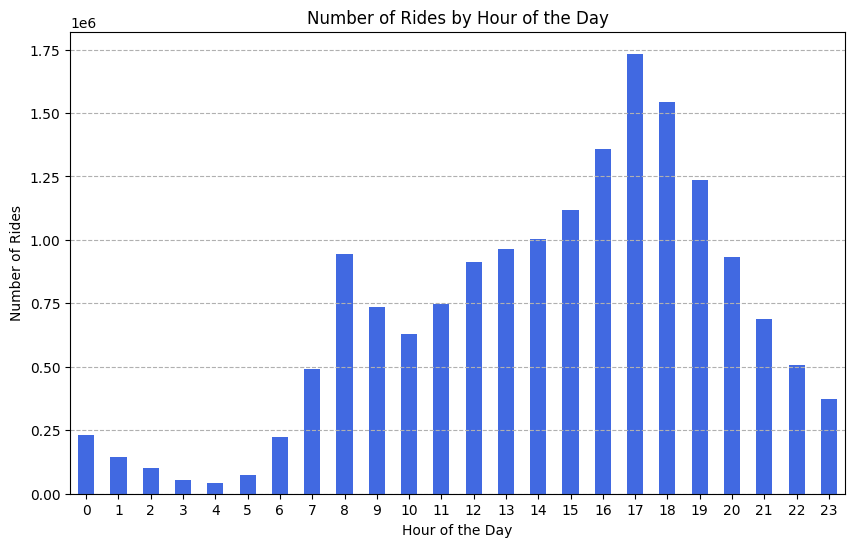

In [38]:
# Extract the hour from 'Start Time' and create a new column 'Hour of Day'
trip_data['Hour of Day'] = trip_data['Start Time'].dt.hour

# Count the number of rides for each hour
rides_per_hour = trip_data.groupby('Hour of Day').size()

# Identify the busiest hour
busiest_hour = rides_per_hour.idxmax()
busiest_hour_rides = rides_per_hour.max()

print(f"The busiest hour of the day is {busiest_hour} with {busiest_hour_rides} rides.")

# Optionally, plot the number of rides for each hour to visualize the distribution
plt.figure(figsize=(10, 6))
rides_per_hour.plot(kind='bar', color='royalblue')
plt.title('Number of Rides by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Rides')
plt.xticks(rotation=0)  # Keep the x-axis labels horizontal for readability
plt.grid(axis='y', linestyle='--')
plt.show()

Number of rides per hour of the day per year

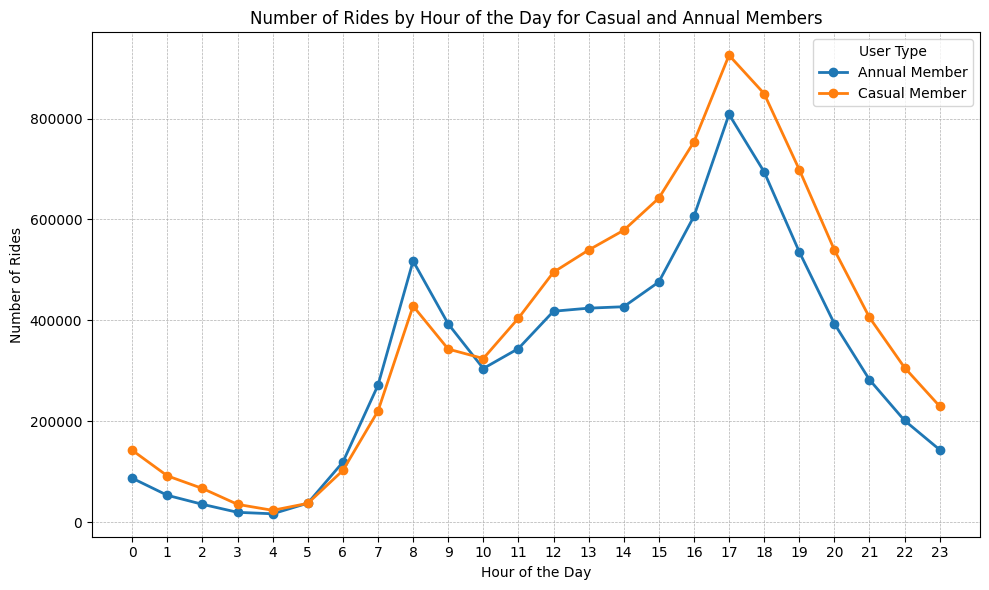

In [39]:
# Group by 'User Type' and 'Hour of Day', then count the number of rides
hourly_rides_by_user_type = trip_data.groupby(['User Type', 'Hour of Day']).size().unstack(level=0)

# Plotting
plt.figure(figsize=(10, 6))

# Plot for each user type
for user_type in hourly_rides_by_user_type.columns:
    plt.plot(hourly_rides_by_user_type.index, hourly_rides_by_user_type[user_type], marker='o', linewidth=2, label=user_type)

plt.title('Number of Rides by Hour of the Day for Casual and Annual Members')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Rides')
plt.xticks(range(0, 24), rotation=0)  # Ensure x-axis labels show all hours
plt.legend(title='User Type')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

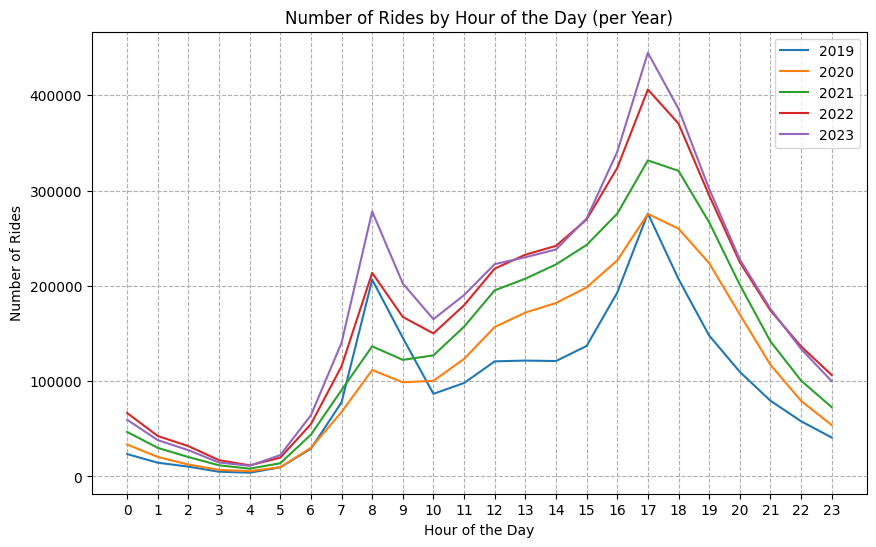

In [40]:
# Count the number of rides for each year and hour
rides_per_year_hour = trip_data.groupby(['Year', 'Hour of Day']).size().unstack()
# Plot the data
plt.figure(figsize=(10, 6))
for year in rides_per_year_hour.index:
    plt.plot(rides_per_year_hour.columns, rides_per_year_hour.loc[year], label=year)

plt.title('Number of Rides by Hour of the Day (per Year)')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Rides')
plt.xticks(range(24))  # Assuming 24 hours in a day
plt.legend()
plt.grid(True, linestyle='--')
plt.show()

Number of rides per hour of the day for casual and non-casual members

These three graphs provide a comprehensive overview of bike-sharing usage patterns, highlighting daily trends, changes across different years, and differences in riding behaviors between casual and annual members.
*   **Overall Daily Usage Patterns:**
      *   Bike-sharing usage has distinct peaks at 8 AM and 5 PM, aligning with typical commuting times. The lowest usage is during early morning hours (1 AM to 5 AM).
*   **Differences Between Casual and Annual Members:**
      *   Casual Members also have peaks during commute hours (8 AM and 5 PM) but maintain higher ridership in the afternoons and evenings, suggesting both commuting and leisure usage.
      *   Annual Members show sharper peaks around typical commuting times, indicating a focus on daily commuting patterns.
*   **Changes in Hourly Usage Over Years:**
      *   2020 shows a significant decline in ridership during peak hours due to COVID-19, while 2021 sees higher ridership than 2019 after 10 AM, suggesting more flexible work hours or increased leisure trips.
      *   2022 and 2023 indicate a recovery in ridership, with 2023 surpassing 2019 levels, particularly during the evening commute.



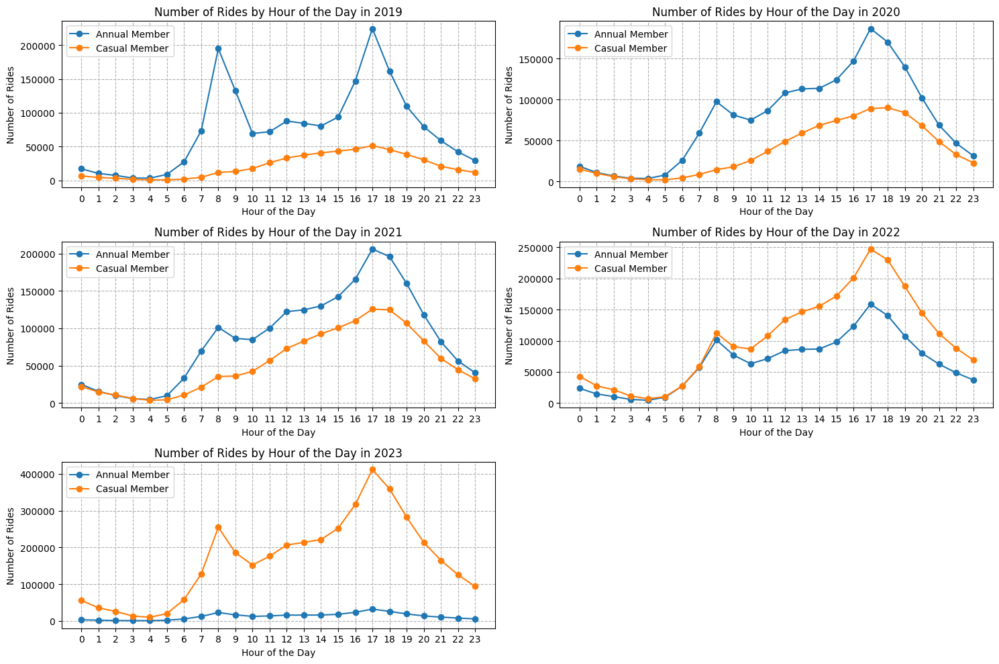

In [41]:
# Count the number of rides for each year and hour
rides_per_year_hour_user = trip_data.groupby(['Year', 'Hour of Day', 'User Type']).size().unstack().fillna(0)

# Plot the data
plt.figure(figsize=(15, 10))

# Get the unique years
unique_years = rides_per_year_hour_user.index.get_level_values('Year').unique()

# Loop through each year and plot for 'Annual Member' and 'Casual Member'
for i, year in enumerate(unique_years, 1):
    plt.subplot(3, 2, i)  # Adjust the grid size based on the number of unique years
    year_data = rides_per_year_hour_user.loc[year]

    # Plot for each user type
    plt.plot(year_data.index, year_data['Annual Member'], label='Annual Member', marker='o')
    plt.plot(year_data.index, year_data['Casual Member'], label='Casual Member', marker='o')

    # Set titles and labels
    plt.title(f'Number of Rides by Hour of the Day in {year}')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Number of Rides')
    plt.xticks(range(24))  # Set x-axis to display each hour of the day
    plt.legend()
    plt.grid(True, linestyle='--')

plt.tight_layout()
plt.show()

<ipython-input-42-e64725d3c71e>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = trip_data.groupby(['Year', 'Day of Week', 'Hour of Day']).size().reset_index(name='Count')


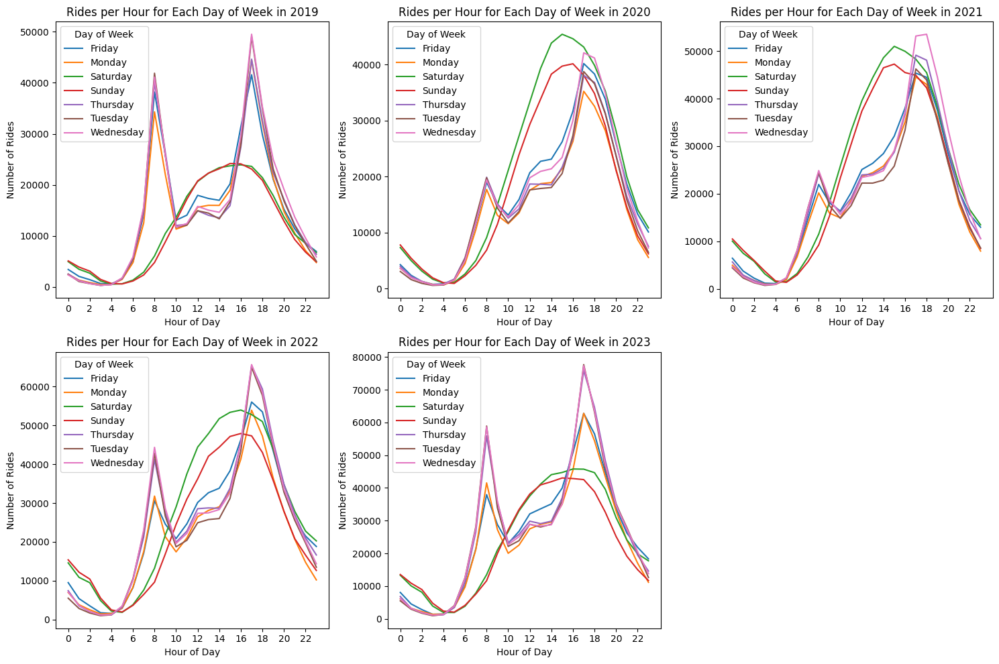

In [42]:
#  Plot data by year and day of week and hour to see how ridership per hour per day of the week chnaged after covid-19
grouped_data = trip_data.groupby(['Year', 'Day of Week', 'Hour of Day']).size().reset_index(name='Count')


# Plotting
plt.figure(figsize=(15, 10))

# Loop through each year
for i, year in enumerate(grouped_data['Year'].unique(), 1):
    # Filter data for the current year
    year_data = grouped_data[grouped_data['Year'] == year]

    # Create a new subplot for each year
    plt.subplot(2, 3, i)  # Adjust the grid size to fit all years nicely

    # Loop through each day of the week to plot lines for each day
    for day in sorted(year_data['Day of Week'].unique()):
        # Filter data for the current day of the week
        day_data = year_data[year_data['Day of Week'] == day]

        # Plot the hourly distribution for the current day
        plt.plot(day_data['Hour of Day'], day_data['Count'], label=day)

    # Set plot titles and labels
    plt.title(f'Rides per Hour for Each Day of Week in {year}')
    plt.xlabel('Hour of Day')
    plt.ylabel('Number of Rides')
    plt.xticks(range(0, 24, 2))  # Show every 2 hours on the x-axis for clarity
    plt.legend(title='Day of Week')

plt.tight_layout()
plt.show()

**Average Trip Duration for Annual and Casual Members**

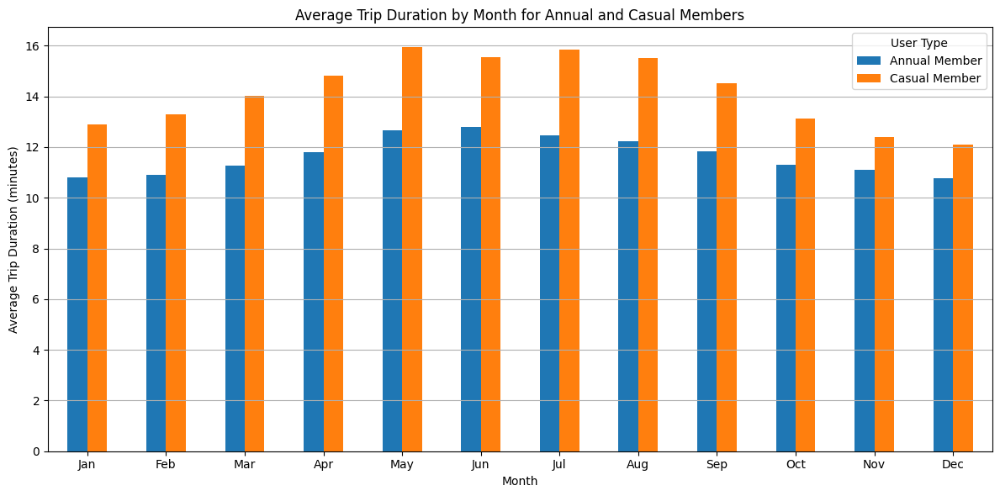

In [43]:
# Group by 'User Type' and month, then calculate the average 'Trip Duration'
trip_data.set_index("Start Time", inplace=True)
average_duration_per_month = trip_data.groupby([trip_data.index.month, 'User Type'])['Trip Duration'].mean().unstack()

# Rename index to month names for readability
average_duration_per_month.index = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Plotting
average_duration_per_month.plot(kind='bar', figsize=(12, 6))

# Add plot labels and title
plt.title('Average Trip Duration by Month for Annual and Casual Members')
plt.xlabel('Month')
plt.ylabel('Average Trip Duration (minutes)')
plt.xticks(rotation=0)
plt.legend(title='User Type')
plt.grid(axis='y')
# Show the plot
plt.tight_layout()
plt.show()

In [44]:
# Analyze the variability in average trip duration for Annual and Casual Members
#  Calculate the mean trip duration for each user type
mean_duration_annual = average_duration_per_month['Annual Member'].mean()
mean_duration_casual = average_duration_per_month['Casual Member'].mean()

# Calculate the maximum deviation from the mean for each user type
max_variation_annual = (average_duration_per_month['Annual Member'] - mean_duration_annual).abs().max()
max_variation_casual = (average_duration_per_month['Casual Member'] - mean_duration_casual).abs().max()

# Convert to percentage of mean
max_variation_percent_annual = (max_variation_annual / mean_duration_annual) * 100
max_variation_percent_casual = (max_variation_casual / mean_duration_casual) * 100

print(f"Mean of average trip durations for Annual Members (across all months): {mean_duration_annual:.2f} minutes")
print(f"Mean of average trip durations for Casual Members (across all months): {mean_duration_casual:.2f} minutes")
print(f"Maximum deviation from the mean for Annual Members (in any month): {max_variation_annual:.2f} minutes")
print(f"Maximum deviation from the mean for Casual Members (in any month): {max_variation_casual:.2f} minutes")
print(f"Maximum deviation from the mean for Annual Members (in percentage): {max_variation_percent_annual:.2f}%")
print(f"Maximum deviation from the mean for Casual Members (in percentage): {max_variation_percent_casual:.2f}%")

Mean of average trip durations for Annual Members (across all months): 11.66 minutes
Mean of average trip durations for Casual Members (across all months): 14.17 minutes
Maximum deviation from the mean for Annual Members (in any month): 1.13 minutes
Maximum deviation from the mean for Casual Members (in any month): 2.07 minutes
Maximum deviation from the mean for Annual Members (in percentage): 9.68%
Maximum deviation from the mean for Casual Members (in percentage): 14.63%


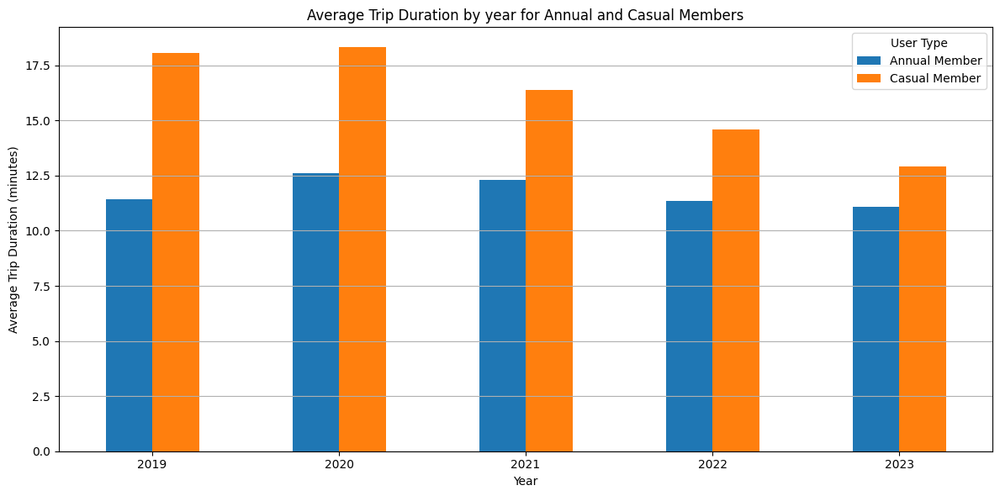

In [45]:
# Plot average trip duration by year to see changes over years
average_duration_per_year = trip_data.groupby(['Year','User Type'])['Trip Duration'].mean().unstack()

# Plotting
average_duration_per_year.plot(kind='bar', figsize=(12, 6))

# Add plot labels and title
plt.title('Average Trip Duration by year for Annual and Casual Members')
plt.xlabel('Year')
plt.ylabel('Average Trip Duration (minutes)')
plt.xticks(rotation=0)
plt.legend(title='User Type')
plt.grid(axis='y')
# Show the plot
plt.tight_layout()
plt.show()

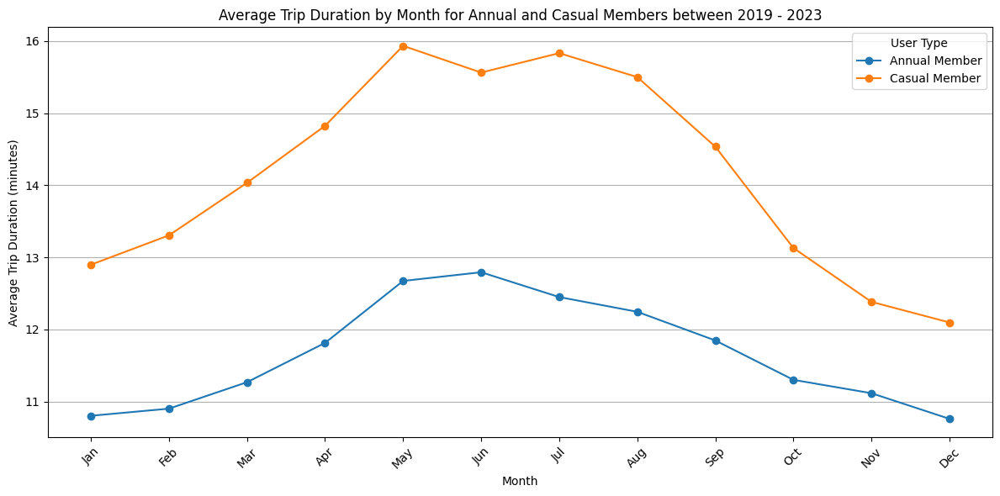

In [46]:
# Plotting
plt.figure(figsize=(12, 6))
for user_type in average_duration_per_month.columns:
    plt.plot(average_duration_per_month.index, average_duration_per_month[user_type], label=user_type, marker='o')

# Add plot labels and title
plt.title('Average Trip Duration by Month for Annual and Casual Members between 2019 - 2023')
plt.xlabel('Month')
plt.ylabel('Average Trip Duration (minutes)')
plt.xticks(average_duration_per_month.index, rotation=45)
plt.legend(title='User Type')
plt.grid(axis='y')
plt.tight_layout()

# Show the plot
plt.show()



*   These graphs show that casual members have significantly longer trip durations than annual members. This trend can be explained by different trip purposes as causal members tend to use bikes for leisure purposes, which usually require long using time than commuting purposes.
*   Casual Members have more variability in their average trip durations across the months, suggesting they are more affected by weather and seasonal factors, likely engaging in leisure riding during warmer months. Annual Members show a more stable pattern, indicating regular, shorter trips, which aligns with commuting behavior.



**Exploratory Data Analysis: Spatial**

**Where are the popular stations and popular routes?**

In [47]:
# What is the most popular station?
# Calculate the value counts for all station IDs
station_ID_count = all_station_Ids.value_counts()

# Get the most popular station ID and its count
most_popular_station_ID = station_ID_count.idxmax()
most_popular_station_count = station_ID_count.max()

# Get the name of the most popular station ID
most_popular_station_name = trip_data[trip_data['Start Station Id'] == most_popular_station_ID]['Start Station Name'].iloc[0]

print(f"The most popular station is: {most_popular_station_name} with {most_popular_station_count} rides.")

The most popular station is: York St / Queens Quay W with 325099 rides.


In [48]:
# I also found the most popular start station and end station using their names. However, as discussed in the spatial data analysis, there are multiple station names
# that do not exist in the current bike share network. Therefore, I will continue my analysis using station ID. This was a good check to see that the total number of
# rides taken from the most popular sttaion is same regardless of if I use the station name or the station ID.

# Count the occurrences of each 'Start Station Name'
start_station_counts = trip_data['Start Station Name'].value_counts()

# Count the occurrences of each 'End Station Name'
end_station_counts = trip_data['End Station Name'].value_counts()

top_10_start_stations_df = pd.DataFrame({
    'Start Station Name': start_station_counts.index,
    'Number of Rides (Start Station)': start_station_counts.values
}).head(10)

# Create a DataFrame for the top 10 most popular end stations
top_10_end_stations_df = pd.DataFrame({
    'End Station Name': end_station_counts.index,
    'Number of Rides (End Station)': end_station_counts.values
}).head(10)

# Display the DataFrames
print("Top 10 Most Popular Start Stations:")
display(top_10_start_stations_df)

print("\nTop 10 Most Popular End Stations:")
display(top_10_end_stations_df)


Top 10 Most Popular Start Stations:


,Start Station Name,Number of Rides (Start Station)
0,York St / Queens Quay W,151538
1,Bay St / College St (East Side),120859
2,Bay St / Queens Quay W (Ferry Terminal),112922
3,Queens Quay E / Lower Sherbourne St,107862
4,Bay St / Wellesley St W,105780
5,Lake Shore Blvd W / Ontario Dr,102617
6,Dundas St E / Regent Park Blvd,102163
7,Dundas St W / Yonge St,99632
8,Bathurst St/Queens Quay(Billy Bishop Airport),99434
9,HTO Park (Queens Quay W),98573



Top 10 Most Popular End Stations:


,End Station Name,Number of Rides (End Station)
0,York St / Queens Quay W,173561
1,Union Station,128772
2,Bay St / College St (East Side),121511
3,Bay St / Queens Quay W (Ferry Terminal),119560
4,Queens Quay E / Lower Sherbourne St,112662
5,Bathurst St/Queens Quay(Billy Bishop Airport),112526
6,HTO Park (Queens Quay W),112464
7,Dundas St W / Yonge St,108939
8,Dundas St E / Regent Park Blvd,105963
9,Queens Quay / Yonge St,103328


The York St / Queens Quay W station is the most popular location in the network, with 325,099 rides either starting or ending there. Additionally, it is the most popular start station, with 151,538 rides beginning there, and the most popular end station, with 173,561 rides concluding there.

In [55]:
# Group the data by 'Start Station Id' and 'End Station Id' and count the number of trips
route_counts = trip_data.groupby(['Start Station Id', 'End Station Id']).size().reset_index(name='Number of Rides')

# Sort the counts in descending order to find the most frequent routes
busiest_routes = route_counts.sort_values(by='Number of Rides', ascending=False)

# Merge to get the station names
busiest_routes = busiest_routes.merge(trip_data[['Start Station Id', 'Start Station Name']].drop_duplicates(),
                                      on='Start Station Id', how='left')
busiest_routes = busiest_routes.merge(trip_data[['End Station Id', 'End Station Name']].drop_duplicates(),
                                      on='End Station Id', how='left')

print("Top 10 Busiest Routes for 2019-2023:")
display(busiest_routes.head(10))

Top 10 Busiest Routes for 2019-2023:


,Start Station Id,End Station Id,Number of Rides,Start Station Name,End Station Name
0,7354,7354,12613,Tommy Thompson Park (Leslie Street Spit),Tommy Thompson Park (Leslie Street Spit)
1,7344,7354,9760,Cherry Beach,Tommy Thompson Park (Leslie Street Spit)
2,7171,7171,9543,Ontario Place Blvd / Lake Shore Blvd W (East),Ontario Place Blvd / Lake Shore Blvd W (East)
3,7354,7344,8792,Tommy Thompson Park (Leslie Street Spit),Cherry Beach
4,7175,7175,8180,HTO Park (Queens Quay W),HTO Park (Queens Quay W)
5,7203,7076,7135,Bathurst St/Queens Quay(Billy Bishop Airport),York St / Queens Quay W
6,7059,7033,7122,Front St W / Blue Jays Way,Union Station
7,7288,7288,7101,Humber Bay Shores Park West,Humber Bay Shores Park West
8,7076,7076,6840,York St / Queens Quay W,York St / Queens Quay W
9,7076,7203,6840,York St / Queens Quay W,Bathurst St/Queens Quay(Billy Bishop Airport)


In [56]:
# most popular routes per user type
# Group the data by 'User Type', 'Start Station Id', and 'End Station Id'
route_counts_by_user_type = trip_data.groupby(['User Type', 'Start Station Id', 'End Station Id']).size().reset_index(name='Number of Rides')

# Sort the counts in descending order to find the most frequent routes for each user type
busiest_routes_by_user_type = route_counts_by_user_type.sort_values(by='Number of Rides', ascending=False)

# Merge to get the station names
busiest_routes_by_user_type = busiest_routes_by_user_type.merge(trip_data[['Start Station Id', 'Start Station Name']].drop_duplicates(),
                                                                on='Start Station Id', how='left')
busiest_routes_by_user_type = busiest_routes_by_user_type.merge(trip_data[['End Station Id', 'End Station Name']].drop_duplicates(),
                                                                on='End Station Id', how='left')

# Separate busiest routes for Annual Members and Casual Members
busiest_routes_annual = busiest_routes_by_user_type[busiest_routes_by_user_type['User Type'] == 'Annual Member']
busiest_routes_casual = busiest_routes_by_user_type[busiest_routes_by_user_type['User Type'] == 'Casual Member']

print("Top 10 Busiest Routes for Annual Members:")
display(busiest_routes_annual.head(10))

print("Top 10 Busiest Routes for Casual Members:")
display(busiest_routes_casual.head(10))

Top 10 Busiest Routes for Annual Members:


,User Type,Start Station Id,End Station Id,Number of Rides,Start Station Name,End Station Name
23,Annual Member,7059,7033,3799,Front St W / Blue Jays Way,Union Station
37,Annual Member,7344,7354,3258,Cherry Beach,Tommy Thompson Park (Leslie Street Spit)
41,Annual Member,7354,7354,3171,Tommy Thompson Park (Leslie Street Spit),Tommy Thompson Park (Leslie Street Spit)
49,Annual Member,7203,7076,2985,Bathurst St/Queens Quay(Billy Bishop Airport),York St / Queens Quay W
65,Annual Member,7354,7344,2805,Tommy Thompson Park (Leslie Street Spit),Cherry Beach
82,Annual Member,7076,7203,2593,York St / Queens Quay W,Bathurst St/Queens Quay(Billy Bishop Airport)
116,Annual Member,7261,7344,2206,Queens Quay E / Lower Sherbourne St,Cherry Beach
127,Annual Member,7171,7171,2135,Ontario Place Blvd / Lake Shore Blvd W (East),Ontario Place Blvd / Lake Shore Blvd W (East)
152,Annual Member,7357,7427,1990,Lake Shore Blvd E / Leslie St,Northern Dancer Blvd / Lake Shore Blvd E
157,Annual Member,7038,7100,1941,Dundas St W / Yonge St,Dundas St E / Regent Park Blvd


Top 10 Busiest Routes for Casual Members:


,User Type,Start Station Id,End Station Id,Number of Rides,Start Station Name,End Station Name
0,Casual Member,7354,7354,9442,Tommy Thompson Park (Leslie Street Spit),Tommy Thompson Park (Leslie Street Spit)
1,Casual Member,7171,7171,7408,Ontario Place Blvd / Lake Shore Blvd W (East),Ontario Place Blvd / Lake Shore Blvd W (East)
2,Casual Member,7175,7175,7236,HTO Park (Queens Quay W),HTO Park (Queens Quay W)
3,Casual Member,7344,7354,6502,Cherry Beach,Tommy Thompson Park (Leslie Street Spit)
4,Casual Member,7354,7344,5987,Tommy Thompson Park (Leslie Street Spit),Cherry Beach
5,Casual Member,7288,7288,5949,Humber Bay Shores Park West,Humber Bay Shores Park West
6,Casual Member,7076,7076,5708,York St / Queens Quay W,York St / Queens Quay W
7,Casual Member,7289,7289,5688,Humber Bay Shores Park East,Humber Bay Shores Park East
8,Casual Member,7514,7514,5455,Humber Bay Shores Park / Marine Parade Dr,Humber Bay Shores Park / Marine Parade Dr
9,Casual Member,7242,7242,5383,Lake Shore Blvd W / Ontario Dr,Lake Shore Blvd W / Ontario Dr


KeyboardInterrupt: 

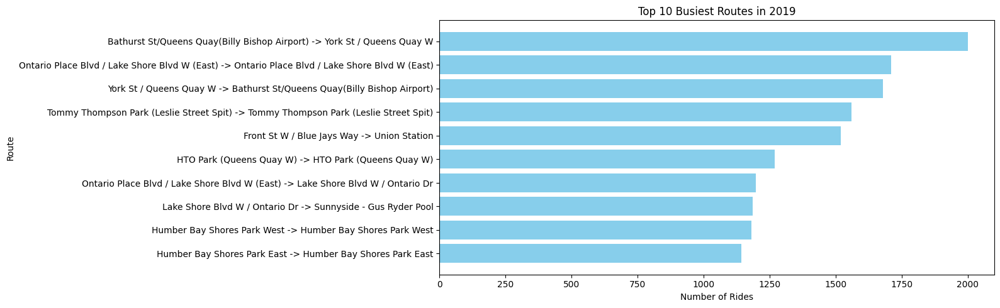

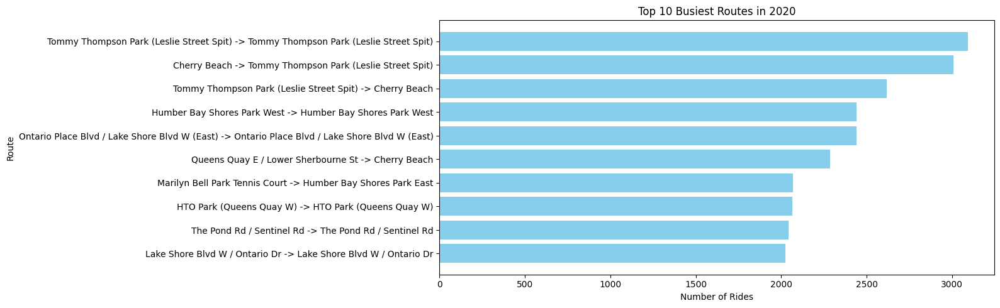

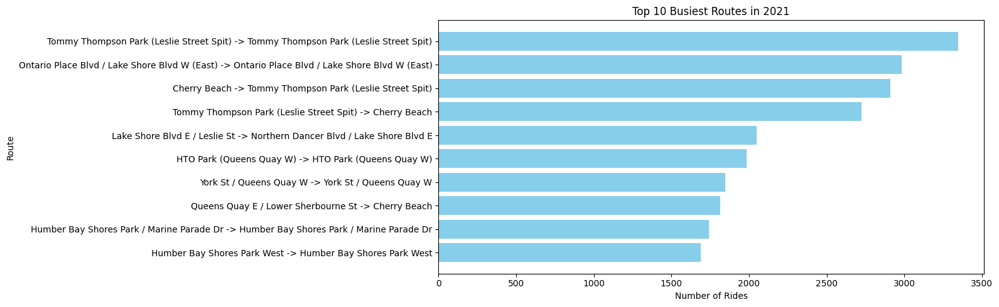

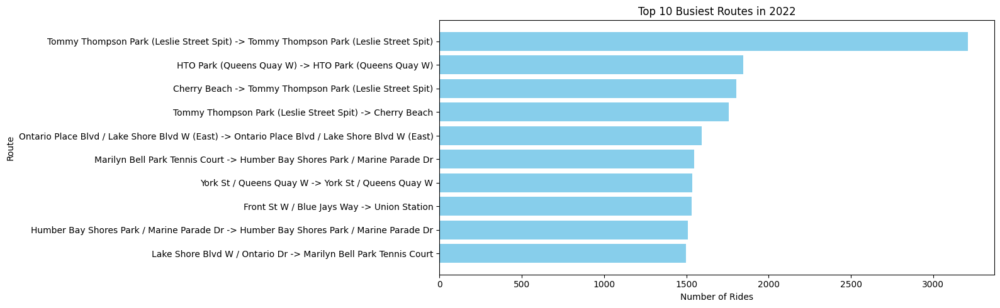

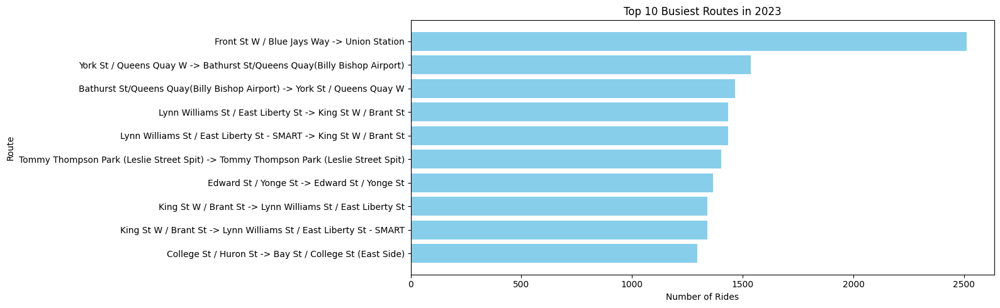

In [53]:
#  Most popular routes per year
route_counts_by_year = trip_data.groupby(['Start Station Id', 'End Station Id', 'Year']).size().reset_index(name='Number of Rides')

# Merge to get the station names
route_counts_by_year = route_counts_by_year.merge(trip_data[['Start Station Id', 'Start Station Name']].drop_duplicates(),
                                                  on='Start Station Id', how='left')
route_counts_by_year = route_counts_by_year.merge(trip_data[['End Station Id', 'End Station Name']].drop_duplicates(),
                                                  on='End Station Id', how='left')

# Create a bar chart for each year
for year in route_counts_by_year['Year'].unique():
    busiest_routes_year = route_counts_by_year[route_counts_by_year['Year'] == year].sort_values(by='Number of Rides', ascending=False).head(10)
    plt.figure(figsize=(16, 5))
    plt.barh(
        busiest_routes_year.apply(lambda x: f"{x['Start Station Name']} -> {x['End Station Name']}", axis=1),
        busiest_routes_year['Number of Rides'],
        color='skyblue'
    )
    plt.title(f'Top 10 Busiest Routes in {year}')
    plt.xlabel('Number of Rides')
    plt.ylabel('Route')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

**Analyzing Bikeways**

How is the length of bikeways changing over years and does it have any impact on the ridership rate?

In [50]:
bikeways_file_path = '/Bikeways/Bike network data - 4326.csv'
bikeways = pd.read_csv(bikeways_file_path)
bikeways.head()

,_id,OBJECTID,SEGMENT_ID,INSTALLED,UPGRADED,PRE_AMALGAMATION,STREET_NAME,FROM_STREET,TO_STREET,ROADCLASS,...,EDITOR,LAST_EDIT_DATE,UPGRADE_DESCRIPTION,CONVERTED,X,Y,LONGITUDE,LATITUDE,Shape__Length,geometry
0,7939,1,1,2001,2021,NaN,Kilbarry Rd,Highbourne Rd,Oriole Pkwy,NaN,...,NaN,2023-01-25T15:57:24,NaN,2007.0,NaN,NaN,NaN,NaN,128.045211,"{'type': 'MultiLineString', 'coordinates': [[[..."
1,7940,2,2,2001,2009,NaN,Martin Goodman / Waterfront Trl,Lake Shore Blvd W,Martin Goodman Trl Branch,NaN,...,NaN,2023-01-25T15:57:24,NaN,NaN,NaN,NaN,NaN,NaN,128.686230,"{'type': 'MultiLineString', 'coordinates': [[[..."
2,7941,3,3,2001,2011,NaN,Gatineau Hydro Corridor Trl,Givendale Rd,Kennedy Rd,NaN,...,NaN,2023-01-25T15:57:24,NaN,NaN,NaN,NaN,NaN,NaN,379.789303,"{'type': 'MultiLineString', 'coordinates': [[[..."
3,7942,4,4,2001,2011,NaN,G Ross Lord Park Trl,Dufferin St,G Ross Lord Park Trl Branch,NaN,...,NaN,2023-01-25T15:57:24,NaN,NaN,NaN,NaN,NaN,NaN,552.499431,"{'type': 'MultiLineString', 'coordinates': [[[..."
4,7943,5,5,2001,2012,NaN,Etobicoke Creek Trl,Etobicoke Creek Trl Branch,Forty Third St,NaN,...,NaN,2023-01-25T15:57:24,NaN,NaN,NaN,NaN,NaN,NaN,152.152899,"{'type': 'MultiLineString', 'coordinates': [[[..."


In [78]:
bikeways.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1323 entries, 0 to 1322
Data columns (total 34 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   _id                  1323 non-null   int64  
 1   OBJECTID             1323 non-null   int64  
 2   SEGMENT_ID           1323 non-null   int64  
 3   INSTALLED            1323 non-null   int64  
 4   UPGRADED             1323 non-null   int64  
 5   PRE_AMALGAMATION     0 non-null      float64
 6   STREET_NAME          1323 non-null   object 
 7   FROM_STREET          1314 non-null   object 
 8   TO_STREET            1312 non-null   object 
 9   ROADCLASS            0 non-null      float64
 10  CNPCLASS             0 non-null      float64
 11  SURFACE              0 non-null      float64
 12  OWNER                0 non-null      float64
 13  DIR_LOWORDER         0 non-null      float64
 14  INFRA_LOWORDER       1228 non-null   object 
 15  SEPA_LOWORDER        0 non-null      f

In [79]:
# Number of rows before filtering
print("Original number of rows:", bikeways.shape[0])

# Ensure INSTALLED is treated as strings, to handle mixed types
bikeways['INSTALLED'] = bikeways['INSTALLED'].astype(str)

# Define a valid year range
current_year = datetime.now().year
valid_year_range = range(2001, current_year + 1)

# Filter rows where 'INSTALLED' is within the valid year range
# Note: This checks if the INSTALLED year, when converted to an integer, falls within the valid range
bikeways = bikeways[bikeways['INSTALLED'].str.isdigit() & bikeways['INSTALLED'].astype(int).isin(valid_year_range)]

# After filtering, let's see how many rows remain
print("Number of rows after filtering non-year values in INSTALLED:", bikeways.shape[0])

# Counting null values in each column
null_counts_bikeways = bikeways.isnull().sum()

# Printing the number of null values in each column
print(null_counts_bikeways)

Original number of rows: 1323
Number of rows after filtering non-year values in INSTALLED: 1305
_id                       0
OBJECTID                  0
SEGMENT_ID                0
INSTALLED                 0
UPGRADED                  0
PRE_AMALGAMATION       1305
STREET_NAME               0
FROM_STREET               0
TO_STREET                 1
ROADCLASS              1305
CNPCLASS               1305
SURFACE                1305
OWNER                  1305
DIR_LOWORDER           1305
INFRA_LOWORDER           80
SEPA_LOWORDER          1305
SEPB_LOWORDER          1305
ORIG_LOWORDER_INFRA    1305
DIR_HIGHORDER          1305
INFRA_HIGHORDER           0
SEPA_HIGHORDER         1305
SEPB_HIGHORDER         1305
ORIG_HIGHORDER         1305
BYLAWED                1305
EDITOR                 1305
LAST_EDIT_DATE            0
UPGRADE_DESCRIPTION    1305
CONVERTED              1258
X                      1305
Y                      1305
LONGITUDE              1305
LATITUDE               1305
Shape__L

In [66]:
# Removing empty columns
bikeways = bikeways.drop(['PRE_AMALGAMATION', 'ROADCLASS', 'CNPCLASS', 'SURFACE', 'OWNER', 'DIR_LOWORDER', 'SEPA_LOWORDER', 'SEPB_LOWORDER', 'ORIG_LOWORDER_INFRA', 'DIR_HIGHORDER', 'SEPA_HIGHORDER', 'SEPB_HIGHORDER', 'ORIG_HIGHORDER', 'BYLAWED', 'EDITOR', 'UPGRADE_DESCRIPTION', 'CONVERTED', 'X', 'Y', 'LONGITUDE', 'LATITUDE'], axis=1)

# I will use 'SEGMENT_ID' as an identifier and will remove _id & OBJECTID.All non-relevant columns.
bikeways = bikeways.drop(['OBJECTID', '_id', 'LAST_EDIT_DATE'], axis=1)
bikeways = bikeways.dropna(subset=['INFRA_LOWORDER'])

In [70]:
INFRA_LOWORDER_Unique_types = bikeways['INFRA_LOWORDER'].unique()
print(INFRA_LOWORDER_Unique_types)

['Sharrows - Wayfinding' 'Multi-Use Trail' 'Multi-Use Trail - Entrance'
 'Cycle Track' 'Park Road' 'Sharrows' 'Bike Lane'
 'Bi-Directional Cycle Track' 'Signed Route (No Pavement Markings)'
 'Multi-Use Trail - Existing Connector' 'Multi-Use Trail - Boulevard'
 'Multi-Use Trail - Connector' 'Bike Lane - Buffered'
 'Sharrows - Arterial - Connector']


In [68]:
INFRA_HIGHORDER_Unique_types = bikeways['INFRA_HIGHORDER'].unique()
print(INFRA_HIGHORDER_Unique_types)

['Sharrows - Wayfinding' 'Multi-Use Trail' 'Multi-Use Trail - Entrance'
 'Cycle Track' 'Park Road' 'Sharrows' 'Bike Lane'
 'Bi-Directional Cycle Track' 'Signed Route (No Pavement Markings)'
 'Multi-Use Trail - Existing Connector' 'Multi-Use Trail - Boulevard'
 'Multi-Use Trail - Connector' 'Bike Lane - Buffered'
 'Sharrows - Arterial - Connector' 'Bike Lane - Contraflow'
 'Cycle Track - Contraflow']


In [69]:
bikeways.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1228 entries, 0 to 1322
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   SEGMENT_ID       1228 non-null   int64  
 1   INSTALLED        1228 non-null   int64  
 2   UPGRADED         1228 non-null   int64  
 3   STREET_NAME      1228 non-null   object 
 4   FROM_STREET      1228 non-null   object 
 5   TO_STREET        1228 non-null   object 
 6   INFRA_LOWORDER   1228 non-null   object 
 7   INFRA_HIGHORDER  1228 non-null   object 
 8   Shape__Length    1228 non-null   float64
 9   geometry         1228 non-null   object 
dtypes: float64(1), int64(3), object(6)
memory usage: 105.5+ KB


In [71]:
bikeways = bikeways[~bikeways['INFRA_LOWORDER'].isin(['Signed Route (No Pavement Markings)', 'Park Road', 'Sharrows - Arterial - Connector', 'Sharrows', 'Multi-Use Trail - Existing Connector', 'Multi-Use Trail - Boulevard', 'Multi-Use Trail - Connector', 'Cycle Track - Contraflow', 'Multi-Use Trail - Entrance'])]
bikeways = bikeways[~bikeways['INFRA_HIGHORDER'].isin(['Signed Route (No Pavement Markings)', 'Park Road', 'Sharrows - Arterial - Connector', 'Sharrows', 'Multi-Use Trail - Existing Connector', 'Multi-Use Trail - Boulevard', 'Multi-Use Trail - Connector', 'Cycle Track - Contraflow', 'Multi-Use Trail - Entrance'])]

In [73]:
# Group by 'INSTALLED' year and sum 'Shape__Length' for each group to get the total length installed per year.
# The "SHAPE_LENGTH" field identifies the length of the segment, which is measured in centreline metres.
bikeways['length_km'] = bikeways['Shape__Length'] / 1000
total_length_per_year = bikeways.groupby('INSTALLED')['length_km'].sum().reset_index()
total_length_per_year.columns = ['Year', 'Total Length (km)']

# Display the total length of bikeways installed each year
print(total_length_per_year)

    Year  Total Length (km)
0   2001         345.906112
1   2002           7.858281
2   2003          10.367078
3   2004          21.170671
4   2005          14.257746
5   2006           7.580088
6   2007          38.390102
7   2008          18.685241
8   2009          19.743689
9   2010           6.869651
10  2011          39.262969
11  2012          16.044206
12  2013           3.290518
13  2014           8.448622
14  2015           6.037625
15  2016           7.671090
16  2017          12.018778
17  2018          16.547719
18  2019           5.703663
19  2020          41.798062
20  2021          16.865517
21  2022           1.884693


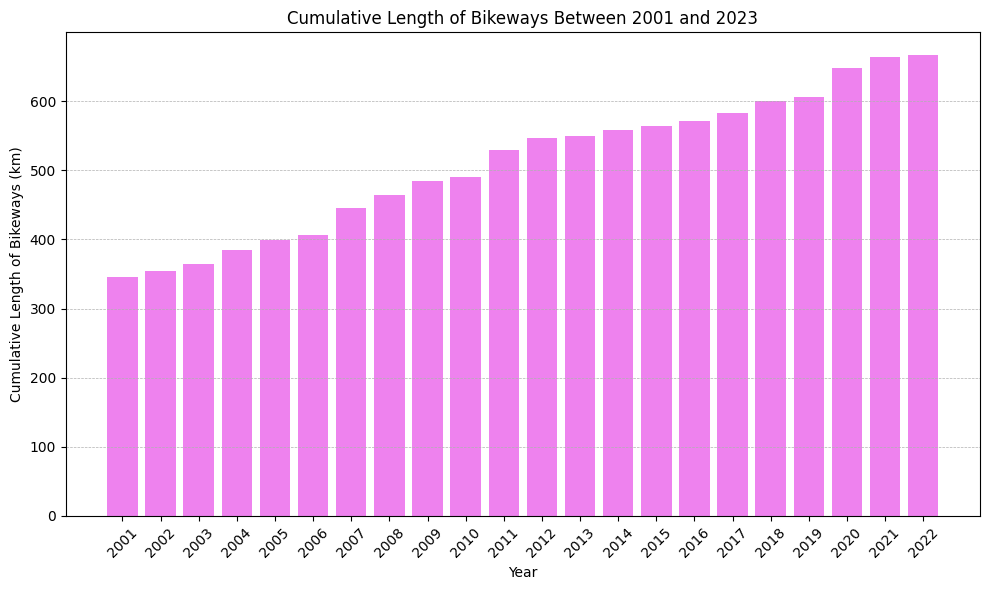

In [83]:
# Visualize the total length of existing bikeways per year and see the variation in the length of bikeways per year

# Calculate cumulative sum of lengths
total_length_per_year['Cumulative Length'] = total_length_per_year['Total Length (km)'].cumsum()

# Reset index if 'total_length_per_year' is a Series; if it's already a DataFrame with 'INSTALLED' as a column, this may not be needed
total_length_per_year.reset_index(drop=True, inplace=True)

# Visulalize the cumulative length of bikeways across different years
plt.figure(figsize=(10, 6))
plt.bar(total_length_per_year['Year'], total_length_per_year['Cumulative Length'], color='violet')
plt.title('Cumulative Length of Bikeways Between 2001 and 2023')
plt.xlabel('Year')
plt.ylabel('Cumulative Length of Bikeways (km)')
plt.grid(axis='y', linestyle='--', linewidth=0.5)
plt.xticks(total_length_per_year['Year'], rotation=45)
plt.tight_layout()
plt.show()

The graph provides a comprehensive overview of how bikeway infrastructure has developed over time, showing a positive trend in cumulative growth.

*   There is a clear upward trend in the cumulative length of bikeways, suggesting ongoing efforts to expand bikeway infrastructure over the years.
*   Most years show a steady increase in cumulative length, with no major drops, which could indicate consistent investment in bikeway infrastructure.


Let's investigate if there is any relationship between the number of rides and length of bikeways?

In [75]:
# Analyze how new bikeways installed per year impacted ridership
total_length_per_year['Year'] = total_length_per_year['Year'].astype(int)  # Make sure 'Year' is in both DataFrames

# Group by 'Year' and count the number of rides for each year
# Aggregate rides per year
rides_per_year = trip_data.groupby('Year').size().reset_index(name='Rides')
rides_per_year['Year'] = rides_per_year['Year'].astype(int)  # Make sure 'Year' is int in both DataFrames

# Merging, now using 'Year' as the common column if you've renamed it in length_df
merged_data = pd.merge(total_length_per_year, rides_per_year, on='Year', how='inner')

# The DataFrame 'merged_data' now contains 'Year', 'Total Length', and 'Rides'
print(merged_data)

   Year  Total Length (km)  Cumulative Length    Rides
0  2019           5.703663         605.853848  2321744
1  2020          41.798062         647.651910  2735341
2  2021          16.865517         664.517427  3386970
3  2022           1.884693         666.402120  4069161



Analyzing whether the increase in the number of rides is due to new bikeway installations involves examining the relationship between the two variables: the length of new bikeways installed each year (as a measure of infrastructure improvement) and the annual number of rides.

In [64]:
# # Correlation Analysis
# correlation = merged_data['Total Length'].corr(merged_data['Rides'])
# print(f"Correlation coefficient: {correlation}")

**E-bikes and Station Level Analysis**



In [ ]:
json_data = '''
{
    "last_updated": 1563373889,
    "ttl": 19,
    "data": {
        "en": {
            "feeds": [
                {
                    "name": "system regions",
                    "url": "https://tor.publicbikesystem.net/ube/gbfs/v1/en/system_regions"
                },
                {
                    "name": "system_information",
                    "url": "https://tor.publicbikesystem.net/ube/gbfs/v1/en/system_information"
                },
                {
                    "name": "station_information",
                    "url": "https://tor.publicbikesystem.net/ube/gbfs/v1/en/station_information"
                },
                {
                    "name": "station_status",
                    "url": "https://tor.publicbikesystem.net/ube/gbfs/v1/en/station_status"
                },
                {
                    "name": "system_pricing_plans",
                    "url": "https://tor.publicbikesystem.net/ube/gbfs/v1/en/system_pricing_plans"
                }
            ]
        }
    }
}
'''

# Parse JSON
parsed_json = json.loads(json_data)

# Access system information
system_information_url = parsed_json["data"]["en"]["feeds"][1]["url"]

# Print system information URL
print("System Information URL:", system_information_url)

System Information URL: https://tor.publicbikesystem.net/ube/gbfs/v1/en/system_information


In [ ]:
# URL of the JSON file
url_system = "https://tor.publicbikesystem.net/ube/gbfs/v1/en/system_information"

# Fetch JSON data from the URL
response_system = requests.get(url_system)

# Check if request was successful (status code 200)
if response_system.status_code == 200:
    # Parse JSON data
    system_data = response_system.json()

    # Extract system information
    system_id = system_data["data"]["system_id"]
    language = system_data["data"]["language"]
    name = system_data["data"]["name"]
    timezone = system_data["data"]["timezone"]
    build_version = system_data["data"]["build_version"]
    build_label = system_data["data"]["build_label"]
    build_hash = system_data["data"]["build_hash"]
    build_number = system_data["data"]["build_number"]
    mobile_head_version = system_data["data"]["mobile_head_version"]
    mobile_minimum_supported_version = system_data["data"]["mobile_minimum_supported_version"]
    vehicle_count_mechanical = system_data["data"]["_vehicle_count"]["_mechanical_count"]
    vehicle_count_ebike = system_data["data"]["_vehicle_count"]["_ebike_count"]
    station_count = system_data["data"]["_station_count"]

    # Print system information
    print("System ID:", system_id)
    print("Language:", language)
    print("Name:", name)
    print("Timezone:", timezone)
    print("Build Version:", build_version)
    print("Build Label:", build_label)
    print("Build Hash:", build_hash)
    print("Build Number:", build_number)
    print("Mobile Head Version:", mobile_head_version)
    print("Mobile Minimum Supported Version:", mobile_minimum_supported_version)
    print("Vehicle Count (Mechanical):", vehicle_count_mechanical)
    print("Vehicle Count (Ebike):", vehicle_count_ebike)
    print("Station Count:", station_count)
else:
    print("Failed to fetch data from the URL:", url_system)

System ID: bike_share_toronto
Language: en
Name: bike_share_toronto
Timezone: America/Toronto
Build Version: 2024.2
Build Label: 2024-09-04
Build Hash: 20ea380
Build Number: 13
Mobile Head Version: 2
Mobile Minimum Supported Version: 1
Vehicle Count (Mechanical): 8442
Vehicle Count (Ebike): 898
Station Count: 845


As of August 2024, there are 844 stations, 8442 mechanical bikes, and 898 ebikes.

In [ ]:
# URL of the station information JSON file
url_station = "https://tor.publicbikesystem.net/ube/gbfs/v1/en/station_information"

# Fetch JSON data from the URL
response_station = requests.get(url_station)

# Check if request was successful (status code 200)
if response_station.status_code == 200:
    stations = response_station.json()["data"]["stations"]
    for station in stations:
        print("Station ID:", station["station_id"])
        print("Name:", station["name"])
        print("Latitude:", station["lat"])
        print("Longitude:", station["lon"])
        print("Capacity:", station["capacity"])
        print("is_charging_station", station['is_charging_station'])
        print()

else:
    print("Failed to fetch data from the URL:", url_station)

Streaming output truncated to the last 5000 lines.
is_charging_station False

Station ID: 7149
Name: Yarmouth Rd / Christie St
Latitude: 43.67
Longitude: -79.42083333333333
Capacity: 11
is_charging_station False

Station ID: 7150
Name: Dufferin St / Sylvan Av (Dufferin Grove Park)
Latitude: 43.6555556
Longitude: -79.43361111111112
Capacity: 19
is_charging_station False

Station ID: 7151
Name: Essex St / Christie St - SMART
Latitude: 43.6686111
Longitude: -79.42027777777778
Capacity: 19
is_charging_station False

Station ID: 7152
Name: Ossington Ave / Bloor St W
Latitude: 43.661705
Longitude: -79.425734
Capacity: 11
is_charging_station False

Station ID: 7153
Name: Bloor St W / Christie St
Latitude: 43.6638889
Longitude: -79.41888888888889
Capacity: 19
is_charging_station False

Station ID: 7154
Name: Bathurst Subway Station
Latitude: 43.6666667
Longitude: -79.41166666666668
Capacity: 23
is_charging_station False

Station ID: 7155
Name: Bathurst St / Lennox St
Latitude: 43.663808
Longit

In [ ]:
# Create a dataframe for all stations
# Extract relevant information (station name, station ID, coordinates) for each station from the json file
station_list = []
for station in stations:
    station_list.append({
        'Station ID': station["station_id"],
        'Name': station["name"],
        'Latitude': station["lat"],
        'Longitude': station["lon"],
        'is_charging_station': station['is_charging_station']
    })

# Create a DataFrame from the list of dictionaries
df_stations = pd.DataFrame(station_list)

# Display the DataFrame
display(df_stations.head(10))

,Station ID,Name,Latitude,Longitude,is_charging_station
0,7000,Fort York Blvd / Capreol Ct,43.639832,-79.395954,False
1,7001,Wellesley Station Green P,43.664964,-79.383550,True
2,7002,St. George St / Bloor St W,43.667131,-79.399555,False
3,7003,Madison Ave / Bloor St W,43.667018,-79.402796,False
4,7005,King St W / York St,43.648001,-79.383177,False
5,7006,Bay St / College St (East Side),43.660439,-79.385525,False
6,7007,College St / Huron St,43.658148,-79.398167,False
7,7008,Wellesley St W / Queen's Park Cres,43.663376,-79.392125,False
8,7009,King St E / Jarvis St,43.650325,-79.372287,False
9,7010,King St W / Spadina Ave,43.645323,-79.395003,False


In [ ]:
df_stations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 845 entries, 0 to 844
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Station ID           845 non-null    object 
 1   Name                 845 non-null    object 
 2   Latitude             845 non-null    float64
 3   Longitude            845 non-null    float64
 4   is_charging_station  845 non-null    bool   
dtypes: bool(1), float64(2), object(2)
memory usage: 27.4+ KB


In [ ]:
# data cleaning

# Check for missing values
print(df_stations.isnull().sum())

# Validate latitude and longitude
df_stations = df_stations[(df_stations['Latitude'] >= -90) & (df_stations['Latitude'] <= 90)]
df_stations = df_stations[(df_stations['Longitude'] >= -180) & (df_stations['Longitude'] <= 180)]

# Remove duplicate stations
df_stations = df_stations.drop_duplicates(subset=['Station ID'])

Station ID             0
Name                   0
Latitude               0
Longitude              0
is_charging_station    0
dtype: int64


In [ ]:
df_stations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 845 entries, 0 to 844
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Station ID           845 non-null    object 
 1   Name                 845 non-null    object 
 2   Latitude             845 non-null    float64
 3   Longitude            845 non-null    float64
 4   is_charging_station  845 non-null    bool   
dtypes: bool(1), float64(2), object(2)
memory usage: 27.4+ KB


In [ ]:
#  Visualize charging stations
charging_station_count = 0
# Initialize the map centered around Toronto
map_center = [43.6532, -79.3832]
combined_map = folium.Map(location=map_center, zoom_start=13)

for station in stations:
  if station["is_charging_station"]:
      charging_station_count += 1
      folium.Marker(
          location=[station["lat"], station["lon"]],
          popup=station["name"],
          icon=folium.Icon(color='red', icon='bolt', prefix='fa')
      ).add_to(combined_map)

display(combined_map)

print("Total number of charging stations:", charging_station_count)

Total number of charging stations: 25


In [ ]:
# Visualize all regular and charging stations
for station in stations:
  if station["is_charging_station"]:
      folium.Marker(
          location=[station["lat"], station["lon"]],
          popup=station["name"],
          icon=folium.Icon(color='red', icon='bolt', prefix='fa')
      ).add_to(combined_map)
  else:
      folium.Marker(
          location=[station["lat"], station["lon"]],
          popup=station["name"],
          icon=folium.Icon(color='blue', icon='info-sign', prefix='fa')
      ).add_to(combined_map)

# Add layer control to toggle between layers
folium.LayerControl().add_to(combined_map)

# Display the map
combined_map

Map the bikeways

In [ ]:
# Initialize the map centered around Toronto
map_center = [43.6532, -79.3832]
map_object = folium.Map(location=map_center, zoom_start=13)

# Load the GeoJSON file
gdf_bikeways = gpd.read_file('/cycling-network.geojson')

# Initialize the map centered at a specific location
map_object = folium.Map(location=map_center, zoom_start=13)

# Ensure the GeoDataFrame is in WGS84 latitude-longitude projection (EPSG:4326) for folium
gdf_bikeways = gdf_bikeways.to_crs(epsg=4326)

# Add the GeoJSON to the map
folium.GeoJson(
    gdf_bikeways,
    name='Cycling Network'
).add_to(map_object)

# Add layer control to toggle the GeoJSON layer on and off
folium.LayerControl().add_to(map_object)

map_object

In [ ]:
# Visualize all regular and charging stations on a heatmap

# Initialize the map centered at a specific location
combined_heatmap = folium.Map(location=map_center, zoom_start=13)

# Create separate layers for charging and regular stations
charging_layer = folium.FeatureGroup(name='Charging Stations')
regular_layer = folium.FeatureGroup(name='Regular Stations')

# Add clustering for regular stations
regular_cluster = MarkerCluster().add_to(regular_layer)

# Add markers for each station (both regular and charging)
for station in stations:
    # Determine the color and icon based on whether it's a charging station or not
    if station["is_charging_station"]:
        folium.Marker(
            location=[station["lat"], station["lon"]],
            popup=station["name"],
            icon=folium.Icon(color='red', icon='bolt', prefix='fa')
        ).add_to(charging_layer)
    else:
        folium.Marker(
            location=[station["lat"], station["lon"]],
            popup=station["name"],
            icon=folium.Icon(color='blue', icon='info-sign', prefix='fa')
        ).add_to(regular_cluster)

# Add the bikeways from the GeoJSON file to the map
folium.GeoJson(gdf_bikeways, name='Cycling Network').add_to(combined_heatmap)

# Add the layers to the map
charging_layer.add_to(combined_heatmap)
regular_layer.add_to(combined_heatmap)

# Add layer control to the map to toggle between layers
folium.LayerControl().add_to(combined_heatmap)

# Display the map
display(combined_heatmap)

**Charging Stations and TTC Subway Lines Map**

Where are most of the charging stations located?

In [ ]:
#  Visualize charging stations and subway lines

# Create a buffer around the subway lines to find nearby charging stations
gdf_ttc_map = gpd.read_file('/ttc-subway-shapefile-wgs84/TTC_SUBWAY_LINES_WGS84.shp')
buffer_distance = 0.003
gdf_ttc_buffer = gdf_ttc_map.copy()
gdf_ttc_buffer['geometry'] = gdf_ttc_map.buffer(buffer_distance)

# Spatial join to find charging stations within the buffer area
charging_stations_on_subway = gpd.sjoin(df_stations_gdf[df_stations_gdf['is_charging_station']], gdf_ttc_buffer, how='inner', op='intersects')

# Initialize the map centered at a specific location
combined_map_3 = folium.Map(location=map_center, zoom_start=13)

# Add the GeoJSON layer to the Folium map
folium.GeoJson(
    gdf_ttc_map.to_json(),
    name='TTC Subway Lines'
).add_to(combined_map_3)

# Add charging stations on subway lines with a different marker (e.g., green bolt icon)
for _, row in charging_stations_on_subway.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Name'],
        icon=folium.Icon(color='green', icon='bolt', prefix='fa')
    ).add_to(combined_map_3)

# Add remaining charging stations with a standard marker (e.g., red bolt icon)
for _, row in df_stations_gdf[df_stations_gdf['is_charging_station']].iterrows():
    if row['Station ID'] not in charging_stations_on_subway['Station ID'].values:
        folium.Marker(
            location=[row['Latitude'], row['Longitude']],
            popup=row['Name'],
            icon=folium.Icon(color='red', icon='bolt', prefix='fa')
        ).add_to(combined_map_3)

# Add layer control to toggle between layers
folium.LayerControl().add_to(combined_map_3)

# Display the map
combined_map_3

<ipython-input-111-fed3526a2390>:7: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_ttc_buffer['geometry'] = gdf_ttc_map.buffer(buffer_distance)
/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):


Out of all 25 charging stations, 14 (56%) are strategically located along two major subway lines: Bloor-Danforth and Yonge Street. This placement aligns with Toronto Bike Share's electrification strategy, which focuses on expanding e-bikes along key transportation corridors where cycling demand is highest and there is a significant opportunity to provide first- and last-mile connections to TTC subway stations.


**Ward-level station analysis**


As part of the Four-Year Growth Plan from 2022 to 2025, Bike Share Toronto aims to expand its network to ensure equitable access across the city. One key goal is to install at least one station in each of Toronto's 25 wards by 2024. Is there at least one station in every ward?

In [ ]:
#importing the ward shapefile
ward = gpd.read_file('/City Wards Data.geojson')

# View GeoDataFrame
ward.head()

,_id,AREA_ID,DATE_EFFECTIVE,DATE_EXPIRY,AREA_ATTR_ID,AREA_TYPE_ID,PARENT_AREA_ID,AREA_TYPE,AREA_CLASS_ID,AREA_CLASS,AREA_SHORT_CODE,AREA_LONG_CODE,AREA_NAME,AREA_DESC,FEATURE_CODE,FEATURE_CODE_DESC,TRANS_ID_CREATE,TRANS_ID_EXPIRE,OBJECTID,geometry
0,1,2457740.0,,,25993196.0,528.0,0.0,CITW,0.0,,07,07,Humber River-Black Creek,Humber River-Black Creek (7),0,,279754.0,-1.0,17344785,"MULTIPOLYGON (((-79.49105 43.76350, -79.49008 ..."
1,2,2457739.0,,,25993195.0,528.0,0.0,CITW,0.0,,06,06,York Centre,York Centre (6),0,,279754.0,-1.0,17344801,"MULTIPOLYGON (((-79.44043 43.76340, -79.43998 ..."
2,3,2457738.0,,,25993194.0,528.0,0.0,CITW,0.0,,18,18,Willowdale,Willowdale (18),0,,279754.0,-1.0,17344817,"MULTIPOLYGON (((-79.39449 43.76157, -79.39461 ..."
3,4,2457737.0,,,25993193.0,528.0,0.0,CITW,0.0,,11,11,University-Rosedale,University-Rosedale (11),0,,279754.0,-1.0,17344833,"MULTIPOLYGON (((-79.39004 43.69050, -79.39004 ..."
4,5,2457736.0,,,25993192.0,528.0,0.0,CITW,0.0,,19,19,Beaches-East York,Beaches-East York (19),0,,279754.0,-1.0,17344849,"MULTIPOLYGON (((-79.29864 43.71515, -79.29837 ..."


In [ ]:
# creating a new GeoDataFrame from df_stations DataFrame
df_stations_gdf = gpd.GeoDataFrame(df_stations, geometry=gpd.points_from_xy(df_stations.Longitude, df_stations.Latitude))
# Set the initial CRS for the bike stations GeoDataFrame
df_stations_gdf.set_crs(epsg=4326, inplace=True)
df_stations_gdf.head()

,Station ID,Name,Latitude,Longitude,is_charging_station,geometry
0,7000,Fort York Blvd / Capreol Ct,43.639832,-79.395954,False,POINT (-79.39595 43.63983)
1,7001,Wellesley Station Green P,43.664964,-79.383550,True,POINT (-79.38355 43.66496)
2,7002,St. George St / Bloor St W,43.667131,-79.399555,False,POINT (-79.39956 43.66713)
3,7003,Madison Ave / Bloor St W,43.667018,-79.402796,False,POINT (-79.40280 43.66702)
4,7005,King St W / York St,43.648001,-79.383177,False,POINT (-79.38318 43.64800)


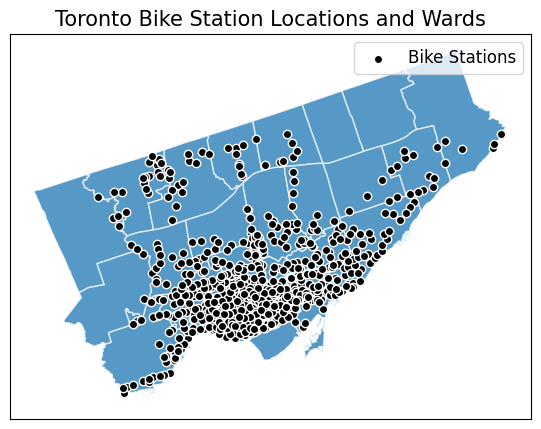

In [ ]:
ward = ward.to_crs(epsg = 26917)
ax = ward.plot(figsize=(12, 5), edgecolor='w', alpha=0.75)  #plotting all ward in the shapefile.

df_stations_gdf = df_stations_gdf.to_crs(epsg = 26917)  #convert to a EPSG:26917 crs
df_stations_gdf.plot(ax=ax, color='black', edgecolor = 'w', label = 'Bike Stations')

plt.legend(fontsize = 12)
plt.title('Toronto Bike Station Locations and Wards', fontsize = 15)
ax.axes.get_xaxis().set_visible(False) #removing xaxis
ax.axes.get_yaxis().set_visible(False)  #removing yaxis

In [ ]:
wards_with_stations = gpd.sjoin(ward, df_stations_gdf, how='left', op='intersects')
wards_without_stations = wards_with_stations[wards_with_stations['index_right'].isna()]
if wards_without_stations.empty:
    print("All wards have bike stations.")
else:
    print("Wards without bike stations:")
    print(wards_without_stations['Name'])

Wards without bike stations:
7     NaN
10    NaN
Name: Name, dtype: object


/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):


As of August 2024, there were no bike stations in two wards: Ward 7 and Ward 10.